# Notebook to extract features using Disvoice 
- Will use the features (Articulation, Prosody and Phonation) to evaluate PD. All features are expected to be worse for a person with PD. 

### Imports 

In [2]:
%run project_setup.py 

from IPython.display import Audio

from disvoice.articulation.articulation import Articulation
from disvoice.phonation.phonation import Phonation
from disvoice.prosody.prosody import Prosody

from constants import personal_path_to_disvoice

2024-01-13 13:41:42.984626: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-13 13:41:42.984653: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-13 13:41:42.985458: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-13 13:41:42.989702: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-13 13:41:43.513775: W tensorflow/compiler/tf2

## Audio to look into: 

In [3]:
file_audio=personal_path_to_disvoice + '/audios/001_ddk1_PCGITA.wav'
path_audio=personal_path_to_disvoice + "/audios/" 

from constants import path_PC_GITA_16k
path_audio=path_PC_GITA_16k + '/Vowels/Patologicas/A/'
print(file_audio)
display(Audio(file_audio,autoplay=False))


/localhome/studenter/malinre/project-thesis/DisVoice/audios/001_ddk1_PCGITA.wav


### How to use the features:
- Extract features and return them as a numpy array, pandas dataframe or a torch. Can extract either static or dynamic features. 

- features1 =articulationf.extract_features_file(file_audio, static=True, plots=False, fmt="npy")
    - fmt is npy, csv or torch
        - chooses if we return it as a numpy array, a pandas dataframe or a torch. 
    - static is true or false
        - chooses if we want static or dynamic features 
    - plots 
        - chooses if we plot the results or not. 







## Articulation
- Speech sounds related to the vocal tracts
    - Vocal tract shapes sounds into vowels or consonants. 
- Physical structure / articulators in the mouth and nose. 
- Material to use: vowels. 

##### Information about the features: 
- Compute articulation features from continuous speech.
- 122 descriptors are computed:
    - 1 - 22. Bark band energies in onset transitions (22 BBE).
    - 23 - 34. Mel frequency cepstral coefficients in onset transitions (12 MFCC onset)
    - 35 - 46. First derivative of the MFCCs in onset transitions (12 DMFCC onset)
    - 47 - 58. Second derivative of the MFCCs in onset transitions (12 DDMFCC onset)
    - 59 - 80. Bark band energies in offset transitions (22 BBE).
    - 81 - 92. MFCCC in offset transitions (12 MFCC offset)
    - 93 - 104. First derivative of the MFCCs in offset transitions (12 DMFCC offset)
    - 105 - 116. Second derivative of the MFCCs in offset transitions (12 DMFCC offset)
    - 117 First formant Frequency
    - 118 First Derivative of the first formant frequency
    - 119 Second Derivative of the first formant frequency
    - 120 Second formant Frequency
    - 121 First derivative of the Second formant Frequency
    - 122 Second derivative of the Second formant Frequency

- In addition, static (for all utterance) or dynamic (at-frame level) features can be computed:
    - The static feature vector is formed with 488 features (122 descriptors) x (4 functionals: mean, std, skewness, kurtosis)
    - The dynamic matrix contains 58 descriptors (22 BBEs, 12 MFCC, 12DMFCC, 12 DDMFCC ) computed for frames of 40 ms of onset segments.

- The first two frames of each recording are not considered for dynamic analysis to be able to stack the derivatives of MFCCs

In [4]:
articulationf=Articulation()

In [5]:
## Extract features and return them as a numpy array
features1 =articulationf.extract_features_file(file_audio, static=True, plots=False, fmt="npy")
# Add plots = True if you want the features to be plotted. 

print(features1.shape)
print(features1)

(1, 488)
[[-2.62086641e+00 -1.80707465e+00 -2.14388988e+00 -2.46727364e+00
  -2.43469791e+00 -2.91110629e+00 -3.35336687e+00 -3.97411176e+00
  -4.20216660e+00 -4.07615859e+00 -4.09317386e+00 -4.19273329e+00
  -4.56686336e+00 -4.58455446e+00 -4.90982155e+00 -5.50801735e+00
  -5.38805751e+00 -5.33481288e+00 -5.51433713e+00 -5.43324074e+00
  -5.83490610e+00 -7.14694880e+00 -2.38004179e+00 -3.03737178e+00
  -7.53899558e+00 -1.90633429e+00  2.91381200e+00 -7.61424255e+00
   4.46749068e+00  7.01080611e-02  4.09572446e+00  2.55352875e+00
   5.94079216e+00 -8.41108080e+00  7.84673916e-03 -1.27431095e-01
  -2.72012421e-01  2.18195945e-01 -9.52124306e-02 -6.16465818e-01
  -9.76405210e-02  3.56656314e-01  5.49242168e-01 -1.88031505e-01
   1.21294449e-01 -5.85621200e-02  4.26597733e-01  3.58056127e-01
   2.27548620e-01  3.15966344e-02 -3.52448489e-01  2.15408808e-01
  -2.03860180e-01  1.62103129e-01  2.51990288e-01 -5.59021145e-01
  -7.23681174e-01  7.69316891e-01 -2.19721429e+00 -1.26883083e+00
 

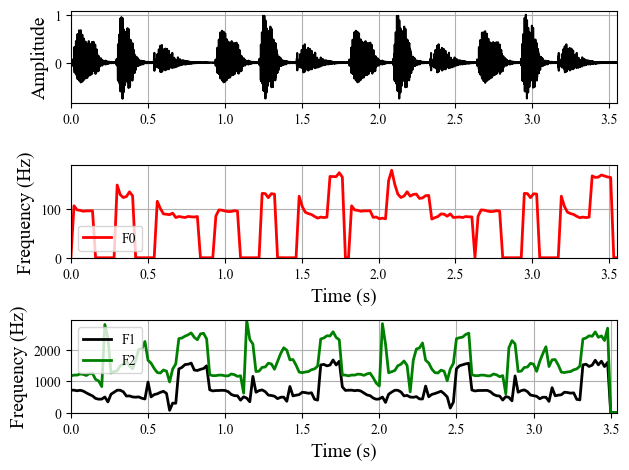

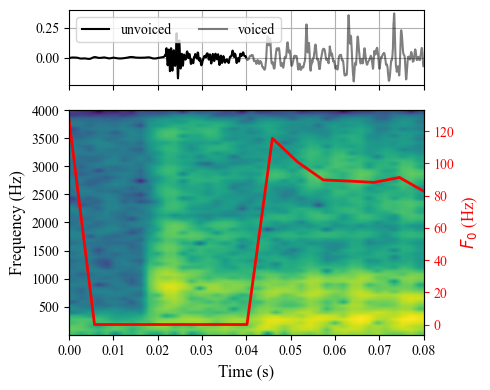

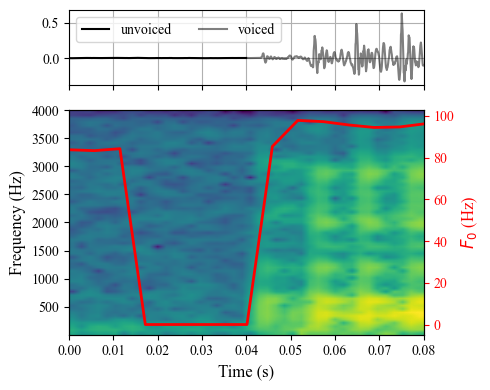

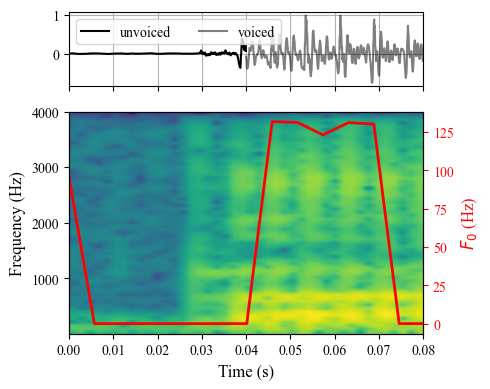

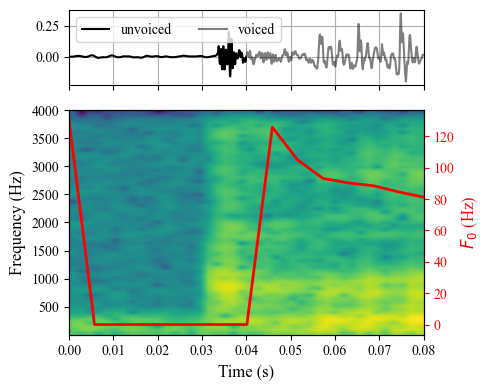

...

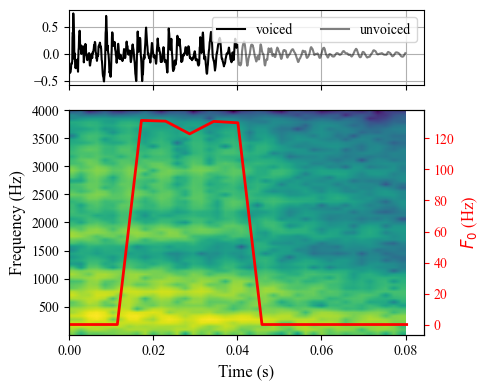

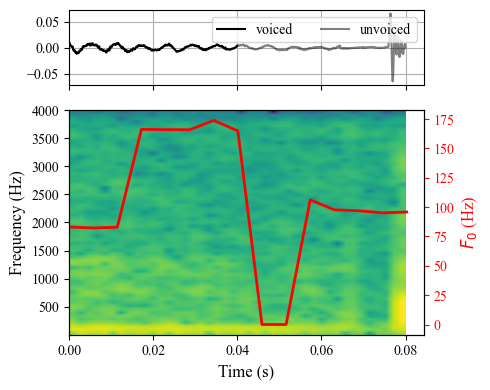

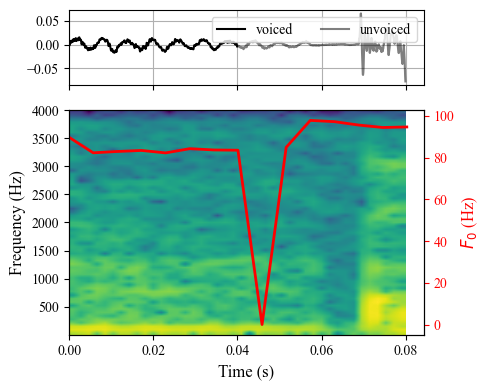

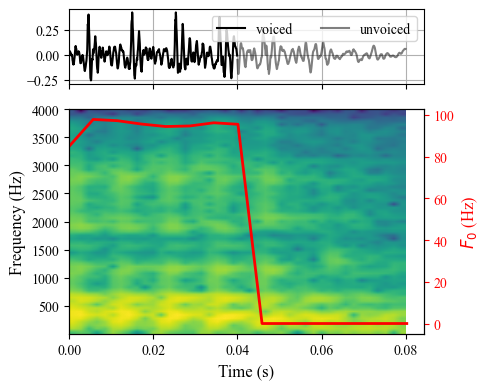

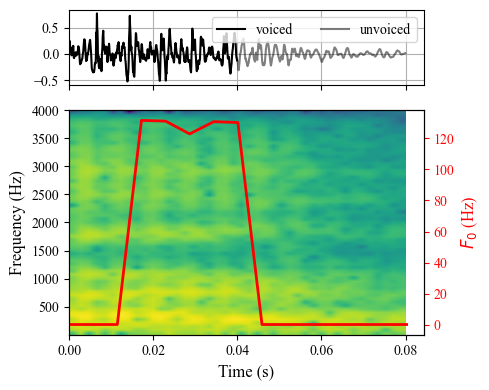

All


,avg BBEon_1,avg BBEon_2,avg BBEon_3,avg BBEon_4,avg BBEon_5,avg BBEon_6,avg BBEon_7,avg BBEon_8,avg BBEon_9,avg BBEon_10,...,kurtosis DDMFCCoff_9,kurtosis DDMFCCoff_10,kurtosis DDMFCCoff_11,kurtosis DDMFCCoff_12,kurtosis F1,kurtosis DF1,kurtosis DDF1,kurtosis F2,kurtosis DF2,kurtosis DDF2
0,-2.620866,-1.807075,-2.14389,-2.467274,-2.434698,-2.911106,-3.353367,-3.974112,-4.202167,-4.076159,...,-1.041752,0.619084,-0.75637,0.595668,0.314205,10.686429,3.761416,-0.696922,11.187812,6.63038


MEL


,avg MFCCon_1,avg MFCCon_2,avg MFCCon_3,avg MFCCon_4,avg MFCCon_5,avg MFCCon_6,avg MFCCon_7,avg MFCCon_8,avg MFCCon_9,avg MFCCon_10,avg MFCCon_11,avg MFCCon_12
0,-2.380042,-3.037372,-7.538996,-1.906334,2.913812,-7.614243,4.467491,0.070108,4.095724,2.553529,5.940792,-8.411081



F1 and F2 and everything inbetween 


,avg F1,avg DF1,avg DDF1,avg F2
0,742.779294,-4.036415,0.003526,1618.257613


 
avg BBEoff_1


0   -2.197214
Name: avg BBEoff_1, dtype: float64

In [6]:
## Extract static features and return them as a dataframe 
features1=articulationf.extract_features_file(file_audio, static=True, plots=True, fmt="csv")
# print(features1) 
print("All")
display(features1) # features1 is a df and it is prettier when we use display. 

# Some methods to extract features: 
print("MEL")
display(features1.iloc[:,22:34]) # The 12 Mel frequency cepstral coefficients in onset transitions

print("")
print("F1 and F2 and everything inbetween ")
display(features1.loc[:, "avg F1":"avg F2"]) # Takes out all the features inbetween those 2 

print(" ")
print("avg BBEoff_1")
display(features1["avg BBEoff_1"]) # Bark band energies in onset transitions, first example




In [7]:
## Extract dynamic features and return them as a dataframe
features1=articulationf.extract_features_file(file_audio, static=False, plots=False, fmt="csv")
print(features1.head())

    BBEon_1   BBEon_2   BBEon_3   BBEon_4   BBEon_5   BBEon_6   BBEon_7  \
0 -1.372197 -0.033660  0.279116  0.216859  1.345059  1.466043  0.073564   
1 -3.371331 -2.639230 -3.093478 -3.149662 -2.847807 -4.176184 -4.755112   
2 -2.597456 -1.633967 -1.925059 -1.228437 -0.557626 -1.673530 -2.889895   
3 -1.223124 -0.384179 -0.070074 -0.675369  0.531350 -0.841073 -0.584536   
4 -3.155692 -3.242846 -3.873316 -4.740832 -5.655081 -6.028498 -6.120387   

    BBEon_8   BBEon_9  BBEon_10  ...  DDMFCCon_3  DDMFCCon_4  DDMFCCon_5  \
0 -0.661689 -0.515421  0.504802  ...    5.545155    6.685234   -6.844475   
1 -6.344404 -7.089428 -7.238274  ...   32.522557   25.072857   -4.218876   
2 -2.371588 -2.019066 -1.995731  ...  -30.873466  -31.441206    2.314444   
3 -1.505295 -2.308978 -2.081991  ...   -2.201797    6.633414    4.856481   
4 -6.344579 -6.066887 -6.626370  ...   23.464894   -2.651206   -1.830673   

   DDMFCCon_6  DDMFCCon_7  DDMFCCon_8  DDMFCCon_9  DDMFCCon_10  DDMFCCon_11  \
0   11.108974

In [8]:
## Extract dynamic features and return them as a torch tensor
features1=articulationf.extract_features_file(file_audio, static=False, plots=False, fmt="torch")
print(features1.dtype)
print(features1.size())

torch.float64
torch.Size([25, 58])


Processing AVPEPUDEA0001_a1.wav:   0%|          | 0/150 [00:00<?, ?it/s]

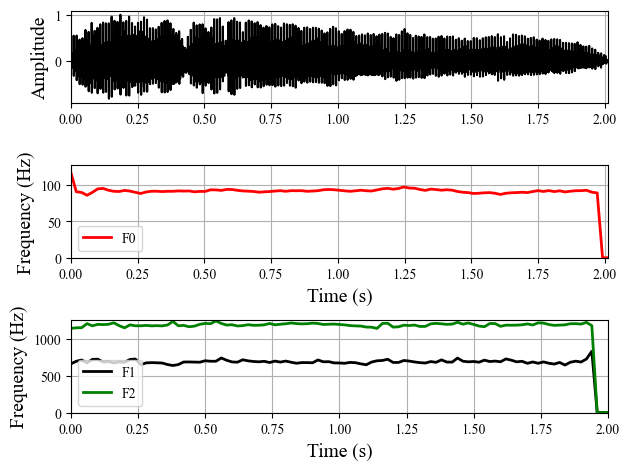

Processing AVPEPUDEA0001_a2.wav:   1%|          | 1/150 [00:00<01:21,  1.84it/s]

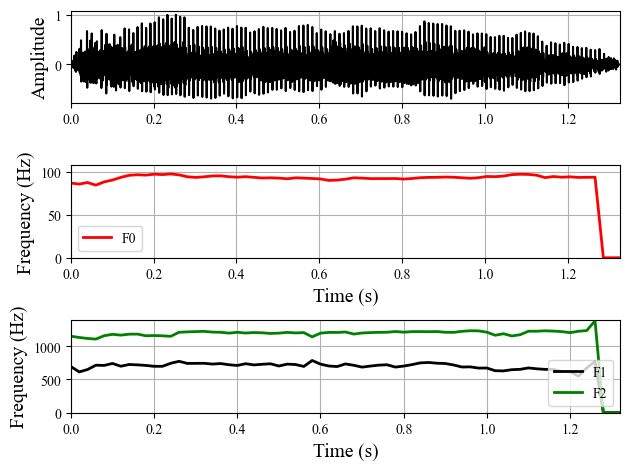

Processing AVPEPUDEA0001_a3.wav:   1%|▏         | 2/150 [00:00<00:59,  2.49it/s]

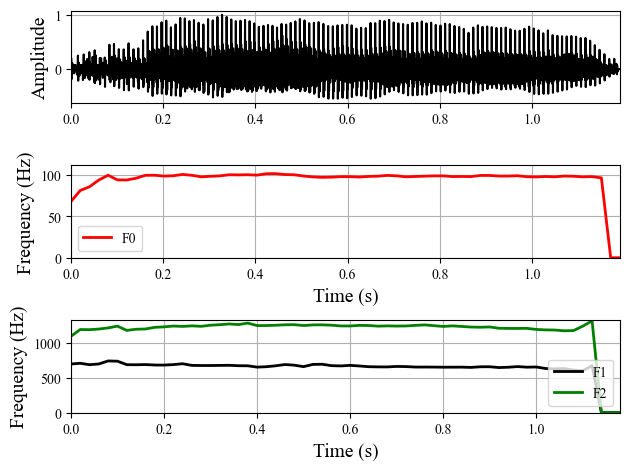

Processing AVPEPUDEA0002_a1.wav:   2%|▏         | 3/150 [00:01<00:50,  2.91it/s]

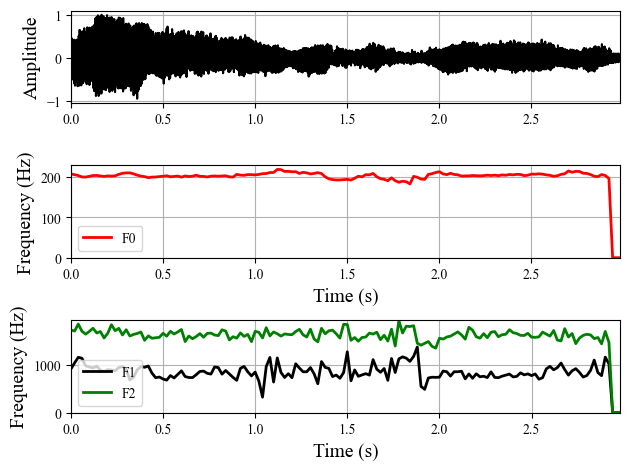

Processing AVPEPUDEA0002_a2.wav:   3%|▎         | 4/150 [00:01<00:49,  2.97it/s]

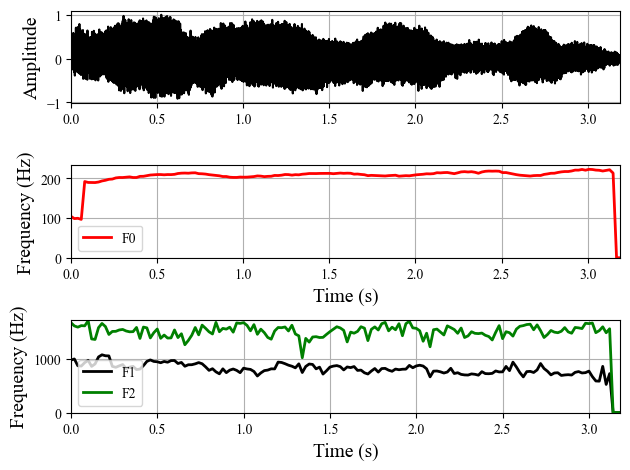

Processing AVPEPUDEA0002_a3.wav:   3%|▎         | 5/150 [00:01<00:47,  3.05it/s]

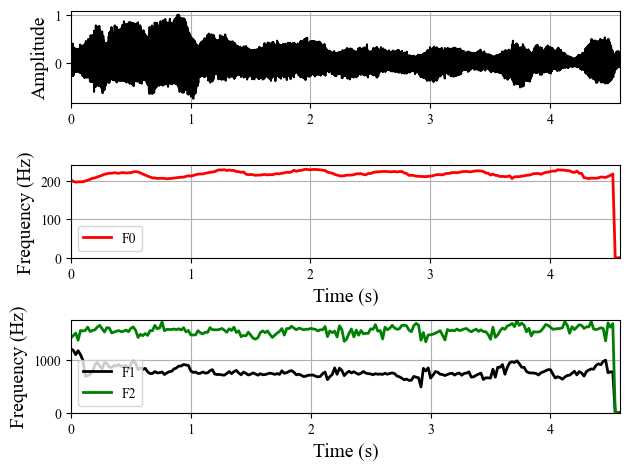

Processing AVPEPUDEA0003_a1.wav:   4%|▍         | 6/150 [00:02<00:46,  3.11it/s]

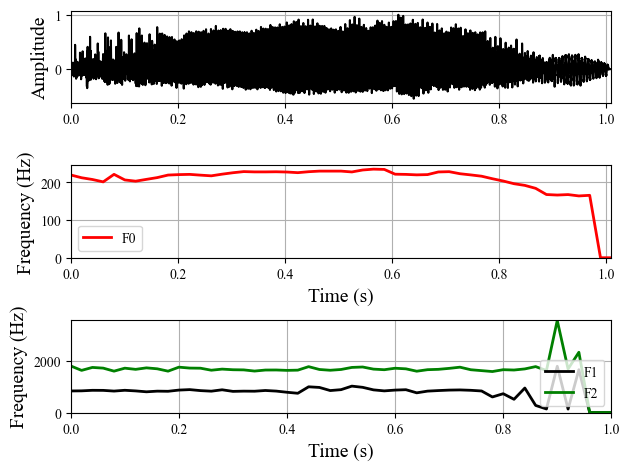

Processing AVPEPUDEA0003_a2.wav:   5%|▍         | 7/150 [00:02<00:44,  3.25it/s]

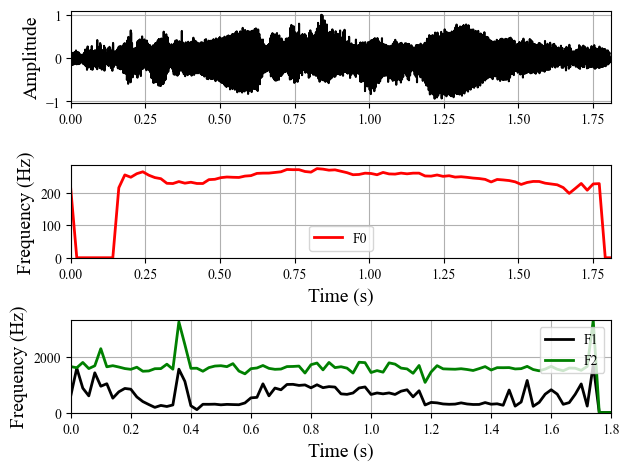

Processing AVPEPUDEA0003_a3.wav:   5%|▌         | 8/150 [00:02<00:44,  3.21it/s]

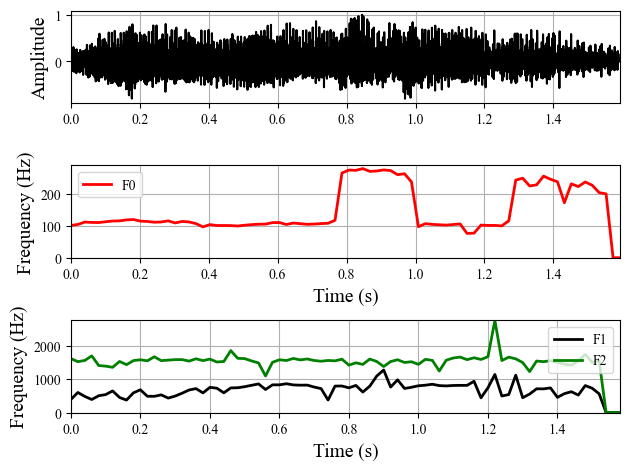

Processing AVPEPUDEA0005_a1.wav:   6%|▌         | 9/150 [00:03<00:45,  3.07it/s]

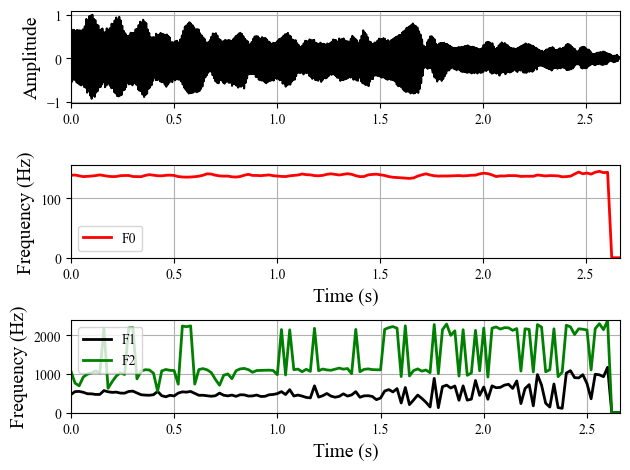

Processing AVPEPUDEA0005_a2.wav:   7%|▋         | 10/150 [00:03<00:46,  3.03it/s]

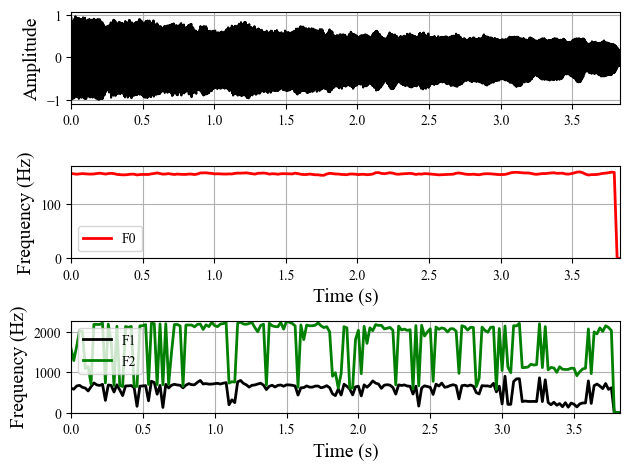

Processing AVPEPUDEA0005_a3.wav:   7%|▋         | 11/150 [00:03<00:45,  3.02it/s]

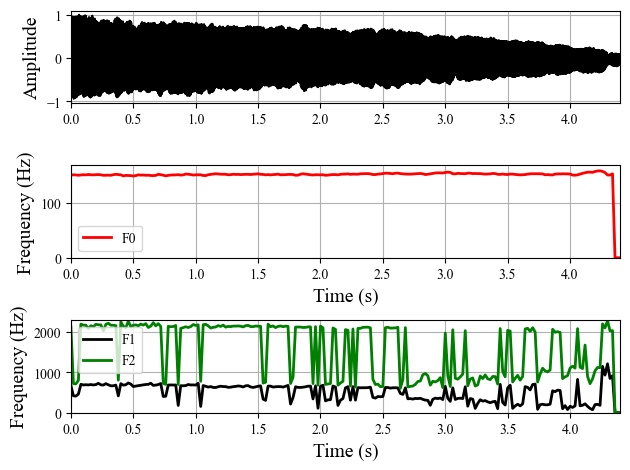

Processing AVPEPUDEA0006_a1.wav:   8%|▊         | 12/150 [00:04<00:45,  3.01it/s]

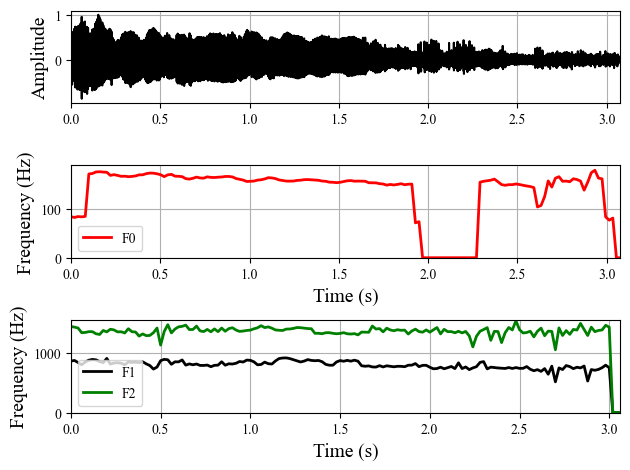

Processing AVPEPUDEA0006_a2.wav:   9%|▊         | 13/150 [00:04<00:45,  2.98it/s]

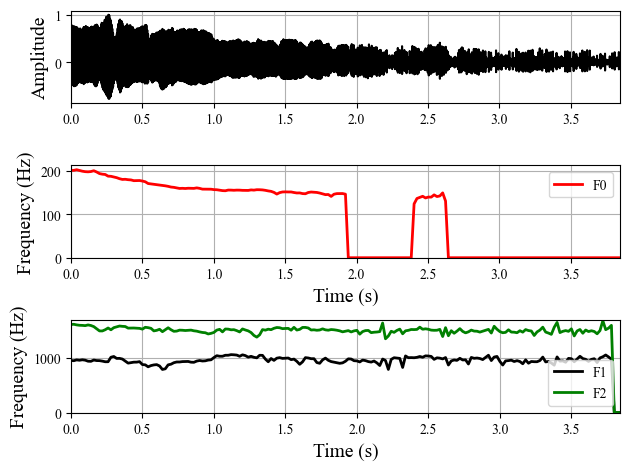

Processing AVPEPUDEA0006_a3.wav:   9%|▉         | 14/150 [00:04<00:45,  2.99it/s]

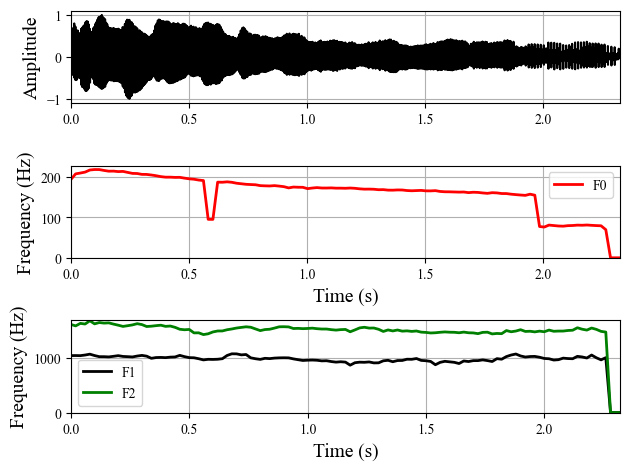

Processing AVPEPUDEA0007_a1.wav:  10%|█         | 15/150 [00:05<00:43,  3.09it/s]

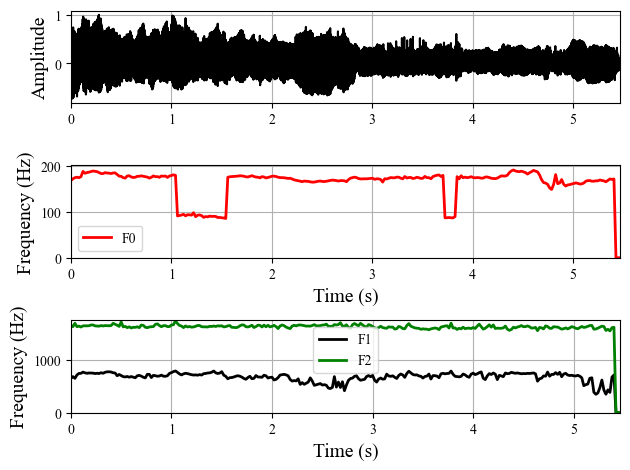

Processing AVPEPUDEA0007_a2.wav:  11%|█         | 16/150 [00:05<00:44,  3.00it/s]

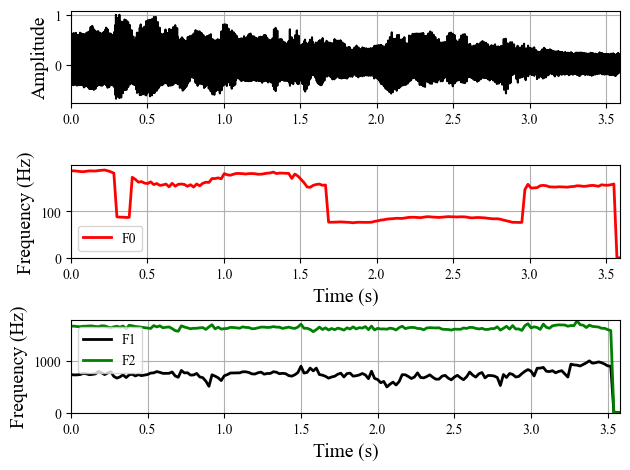

Processing AVPEPUDEA0007_a3.wav:  11%|█▏        | 17/150 [00:05<00:43,  3.03it/s]

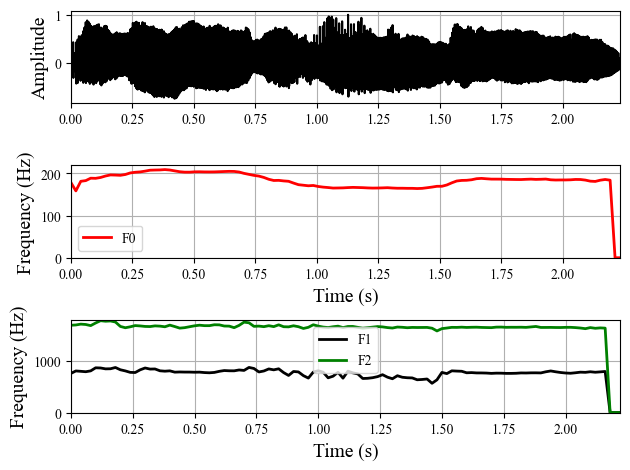

Processing AVPEPUDEA0008_a1.wav:  12%|█▏        | 18/150 [00:06<00:43,  3.07it/s]

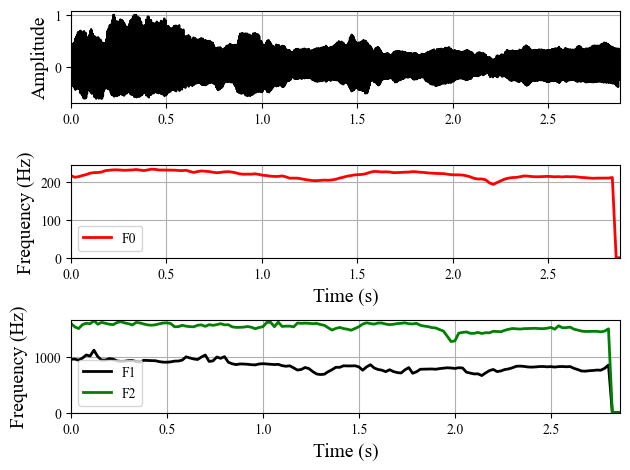

Processing AVPEPUDEA0008_a2.wav:  13%|█▎        | 19/150 [00:06<00:41,  3.13it/s]

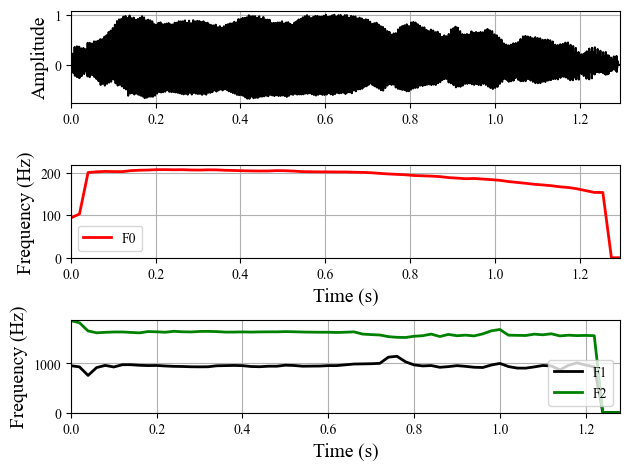

Processing AVPEPUDEA0008_a3.wav:  13%|█▎        | 20/150 [00:06<00:40,  3.18it/s]

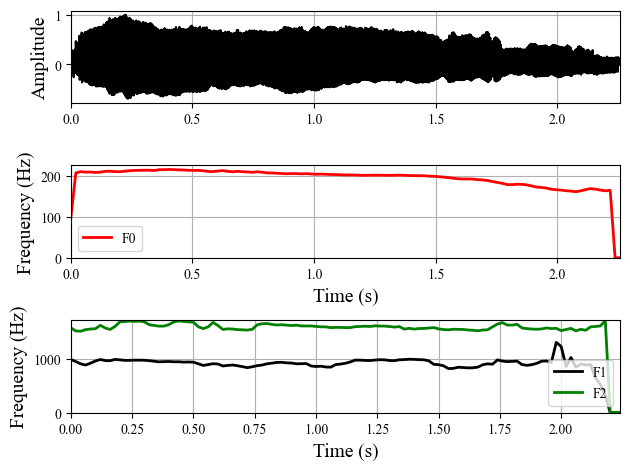

Processing AVPEPUDEA0009_a1.wav:  14%|█▍        | 21/150 [00:07<00:46,  2.77it/s]

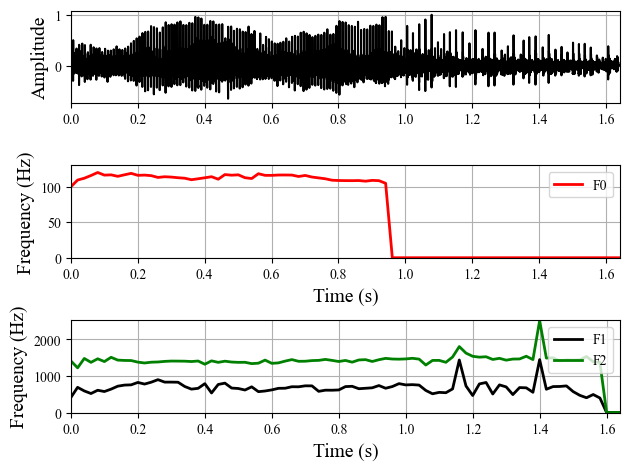

Processing AVPEPUDEA0009_a2.wav:  15%|█▍        | 22/150 [00:07<00:44,  2.89it/s]

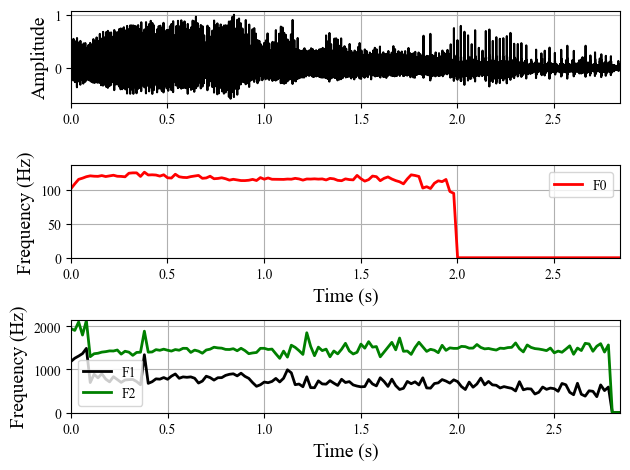

Processing AVPEPUDEA0009_a3.wav:  15%|█▌        | 23/150 [00:07<00:42,  3.00it/s]

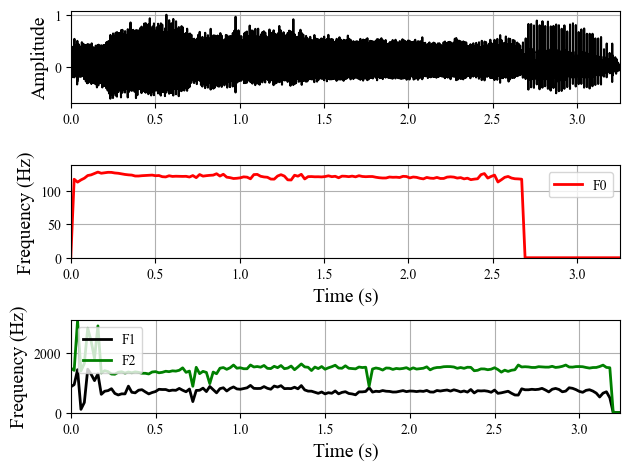

Processing AVPEPUDEA0010_a1.wav:  16%|█▌        | 24/150 [00:08<00:41,  3.05it/s]

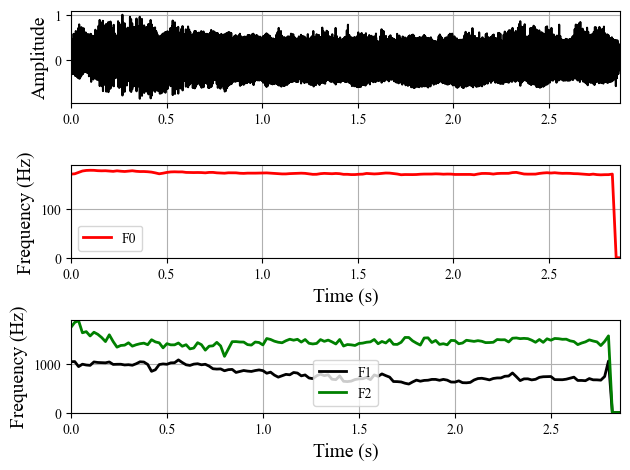

Processing AVPEPUDEA0010_a2.wav:  17%|█▋        | 25/150 [00:08<00:40,  3.09it/s]

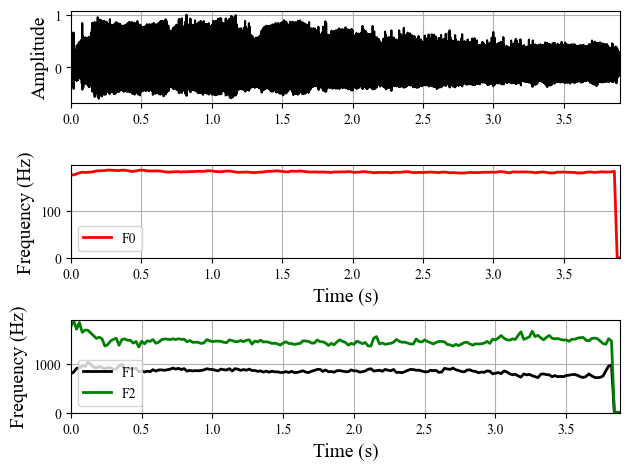

Processing AVPEPUDEA0010_a3.wav:  17%|█▋        | 26/150 [00:08<00:40,  3.05it/s]

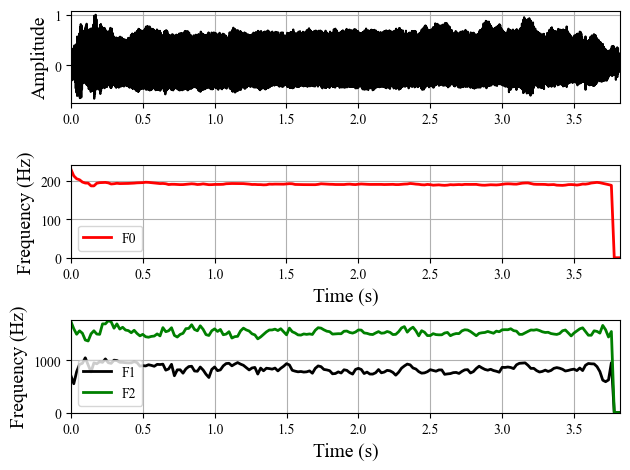

Processing AVPEPUDEA0011_a1.wav:  18%|█▊        | 27/150 [00:09<00:41,  2.95it/s]

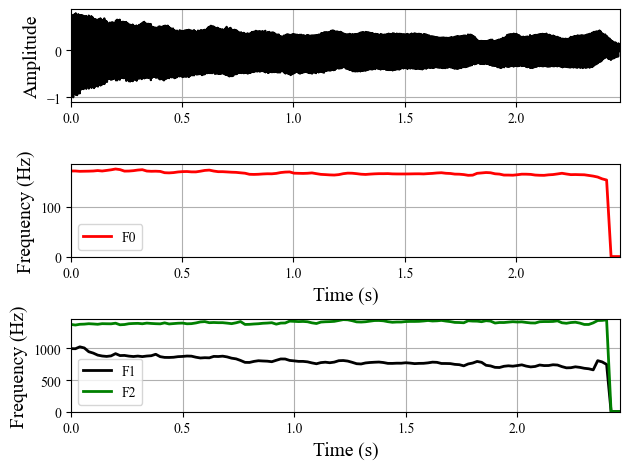

Processing AVPEPUDEA0011_a2.wav:  19%|█▊        | 28/150 [00:09<00:40,  3.04it/s]

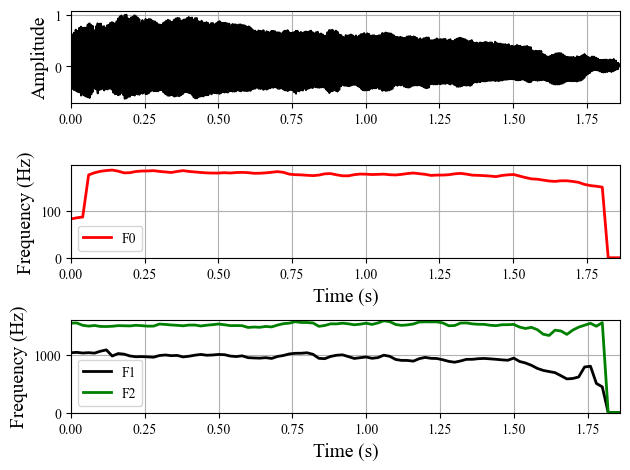

Processing AVPEPUDEA0011_a3.wav:  19%|█▉        | 29/150 [00:09<00:39,  3.07it/s]

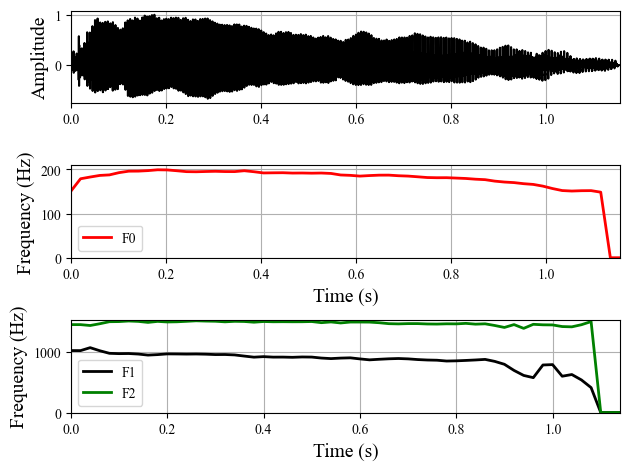

Processing AVPEPUDEA0013_a1.wav:  20%|██        | 30/150 [00:09<00:39,  3.07it/s]

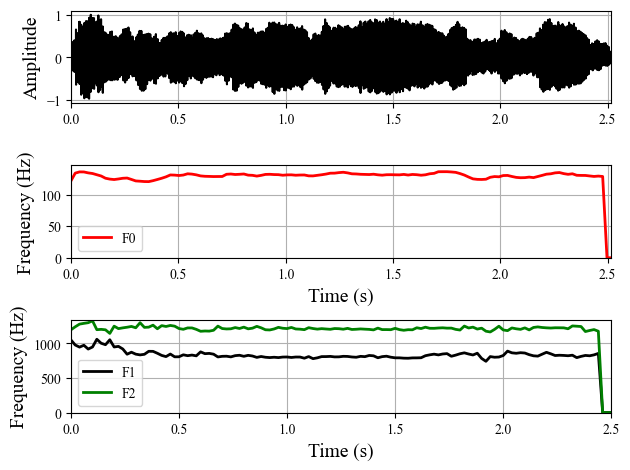

Processing AVPEPUDEA0013_a2.wav:  21%|██        | 31/150 [00:10<00:39,  3.05it/s]

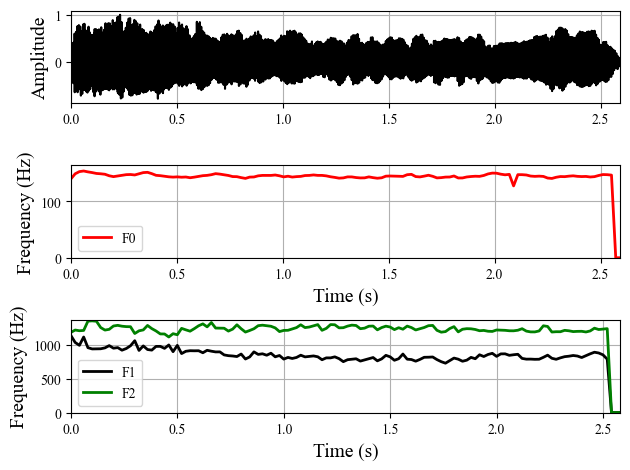

Processing AVPEPUDEA0013_a3.wav:  21%|██▏       | 32/150 [00:10<00:38,  3.07it/s]

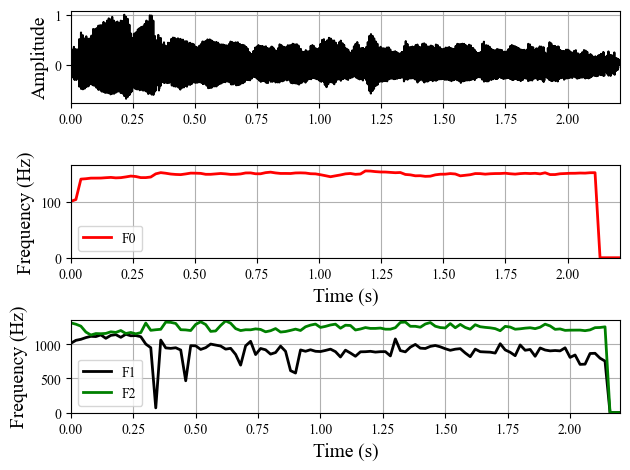

Processing AVPEPUDEA0014_a1.wav:  22%|██▏       | 33/150 [00:10<00:38,  3.03it/s]

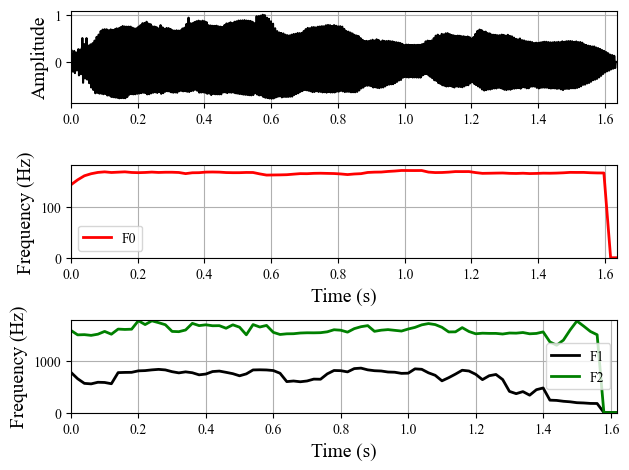

Processing AVPEPUDEA0014_a2.wav:  23%|██▎       | 34/150 [00:11<00:38,  3.05it/s]

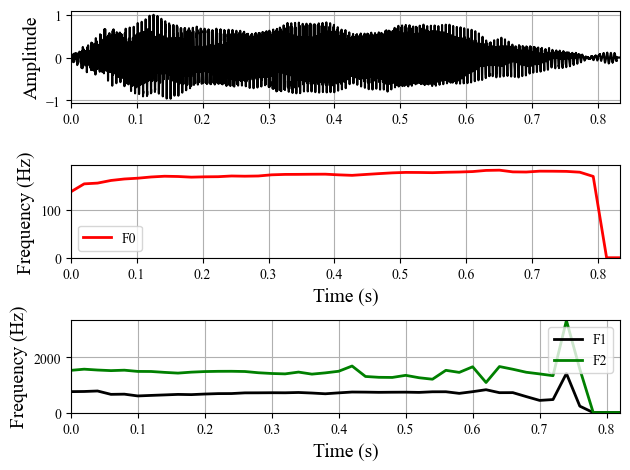

Processing AVPEPUDEA0014_a3.wav:  23%|██▎       | 35/150 [00:11<00:38,  3.02it/s]

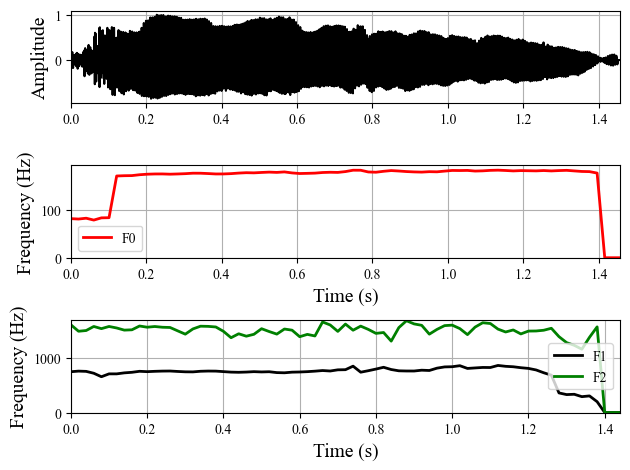

Processing AVPEPUDEA0015_a1.wav:  24%|██▍       | 36/150 [00:11<00:37,  3.06it/s]

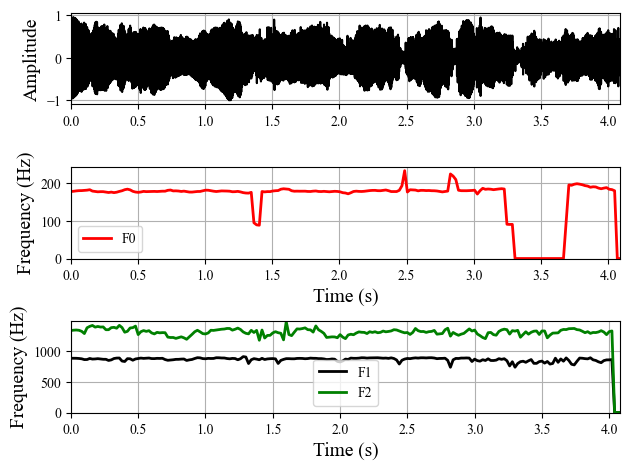

Processing AVPEPUDEA0015_a2.wav:  25%|██▍       | 37/150 [00:12<00:40,  2.78it/s]

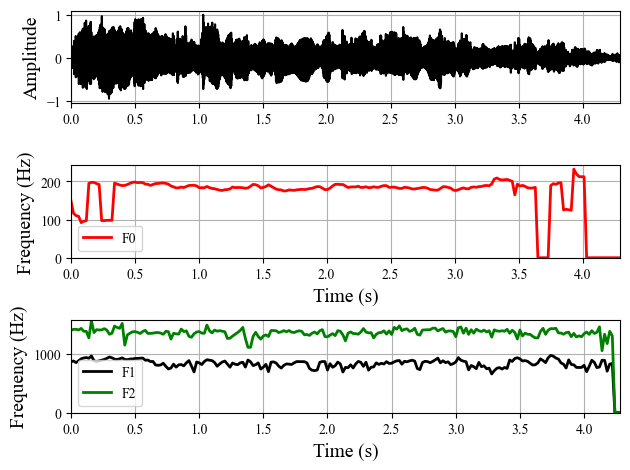

Processing AVPEPUDEA0015_a3.wav:  25%|██▌       | 38/150 [00:12<00:43,  2.58it/s]

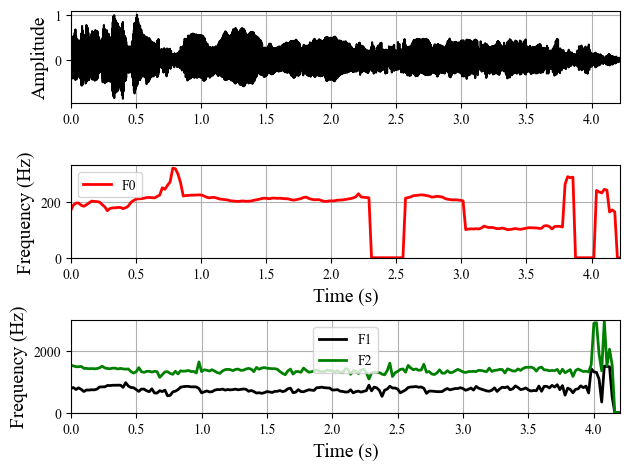

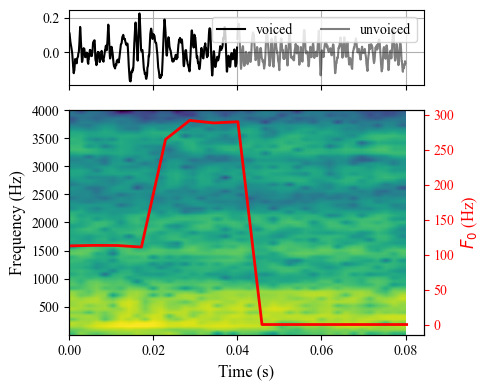

Processing AVPEPUDEA0016_a1.wav:  26%|██▌       | 39/150 [00:13<00:58,  1.91it/s]

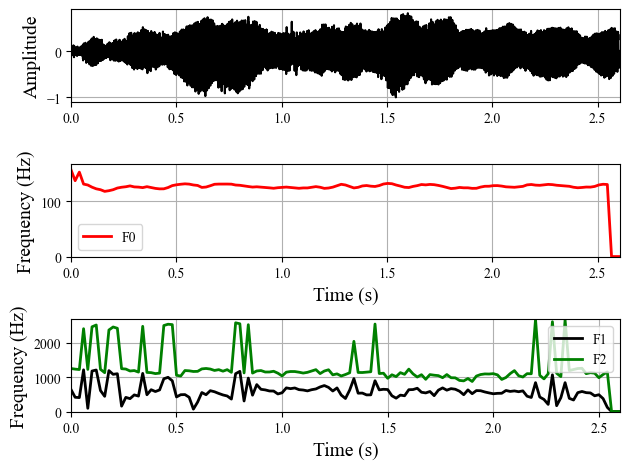

Processing AVPEPUDEA0016_a2.wav:  27%|██▋       | 40/150 [00:14<00:51,  2.13it/s]

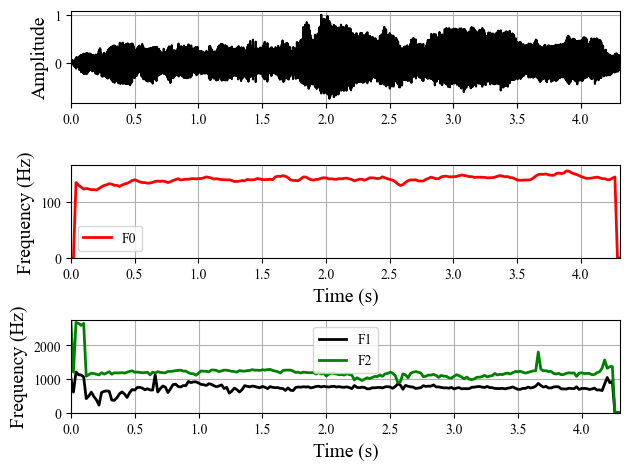

Processing AVPEPUDEA0016_a3.wav:  27%|██▋       | 41/150 [00:14<00:47,  2.28it/s]

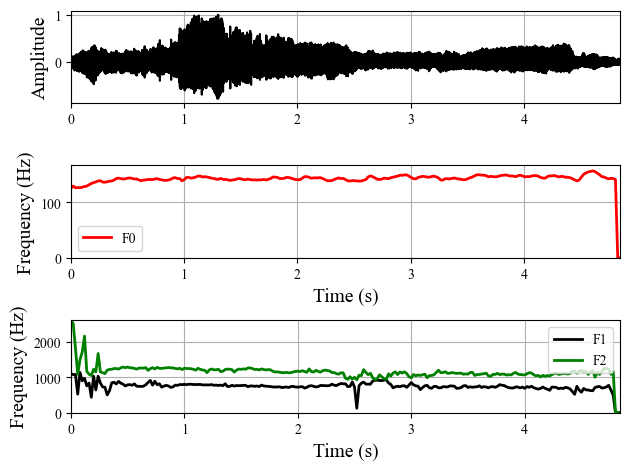

Processing AVPEPUDEA0017_a1.wav:  28%|██▊       | 42/150 [00:14<00:45,  2.38it/s]

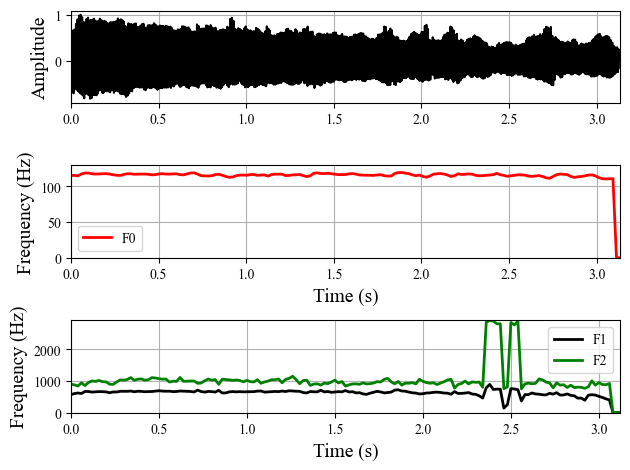

Processing AVPEPUDEA0017_a2.wav:  29%|██▊       | 43/150 [00:15<00:42,  2.52it/s]

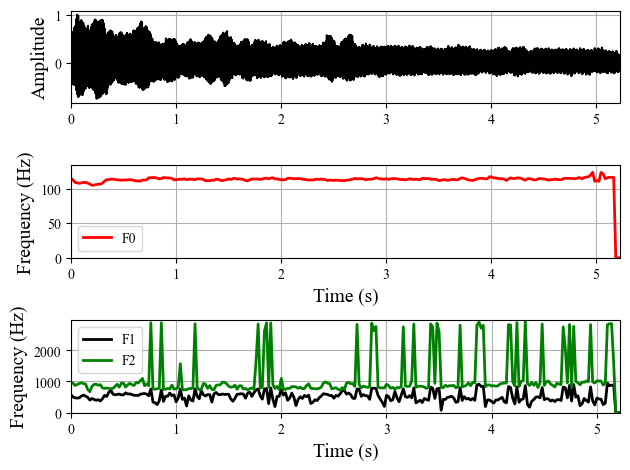

Processing AVPEPUDEA0017_a3.wav:  29%|██▉       | 44/150 [00:15<00:40,  2.64it/s]

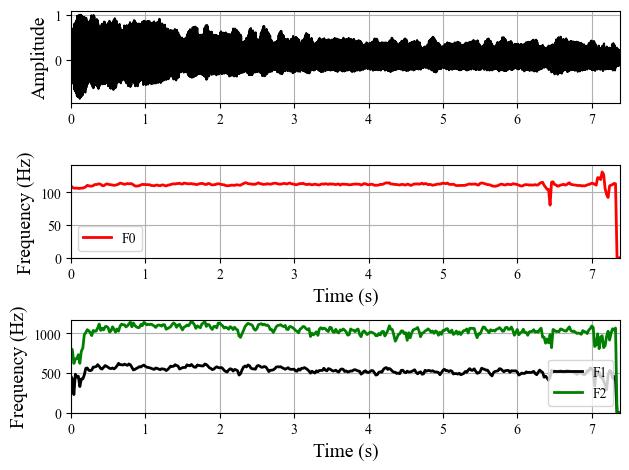

Processing AVPEPUDEA0020_a1.wav:  30%|███       | 45/150 [00:15<00:40,  2.61it/s]

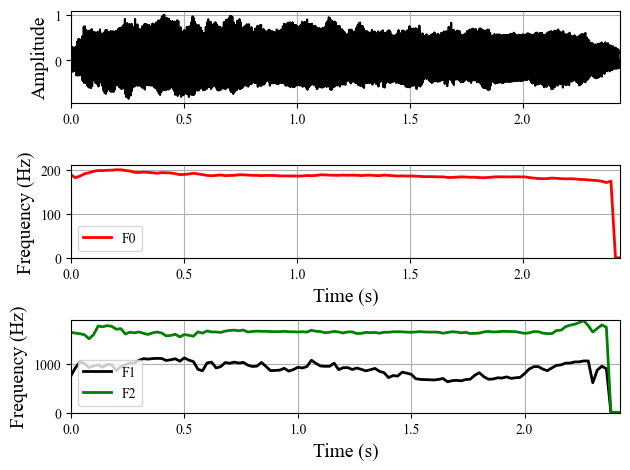

Processing AVPEPUDEA0020_a2.wav:  31%|███       | 46/150 [00:16<00:38,  2.72it/s]

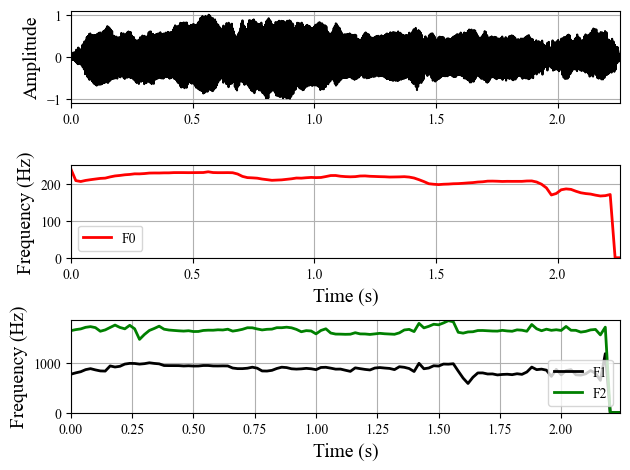

Processing AVPEPUDEA0020_a3.wav:  31%|███▏      | 47/150 [00:16<00:37,  2.72it/s]

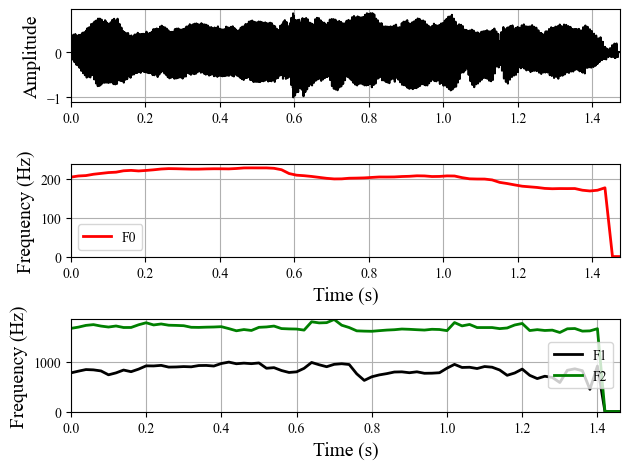

Processing AVPEPUDEA0021_a1.wav:  32%|███▏      | 48/150 [00:16<00:36,  2.82it/s]

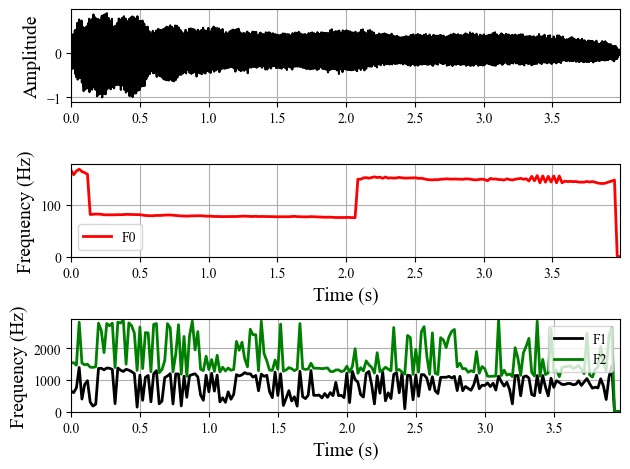

Processing AVPEPUDEA0021_a2.wav:  33%|███▎      | 49/150 [00:17<00:36,  2.75it/s]

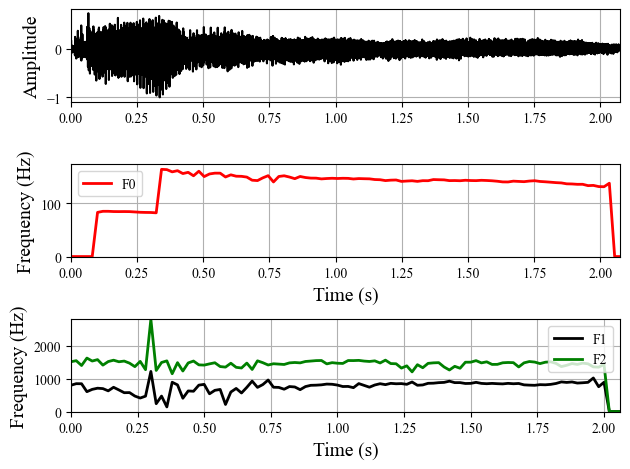

Processing AVPEPUDEA0021_a3.wav:  33%|███▎      | 50/150 [00:17<00:35,  2.81it/s]

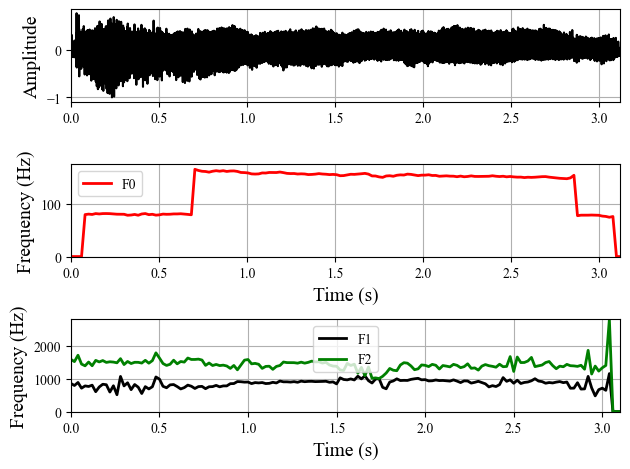

Processing AVPEPUDEA0022_a1.wav:  34%|███▍      | 51/150 [00:17<00:35,  2.76it/s]

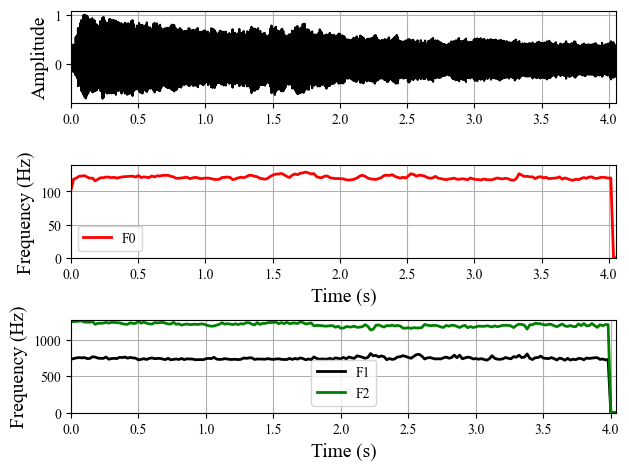

Processing AVPEPUDEA0022_a2.wav:  35%|███▍      | 52/150 [00:18<00:36,  2.70it/s]

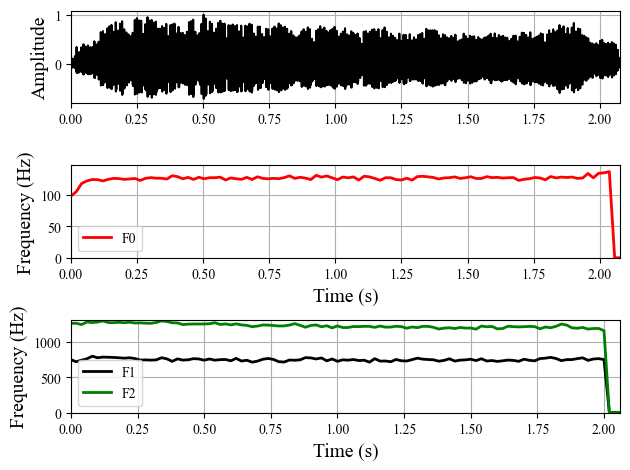

Processing AVPEPUDEA0022_a3.wav:  35%|███▌      | 53/150 [00:18<00:35,  2.75it/s]

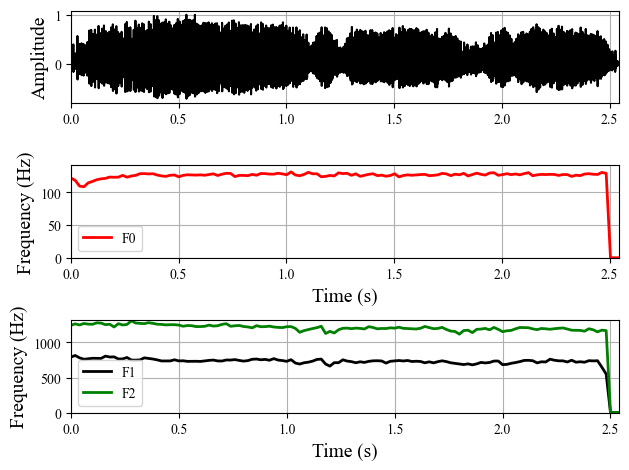

Processing AVPEPUDEA0023_a1.wav:  36%|███▌      | 54/150 [00:19<00:33,  2.83it/s]

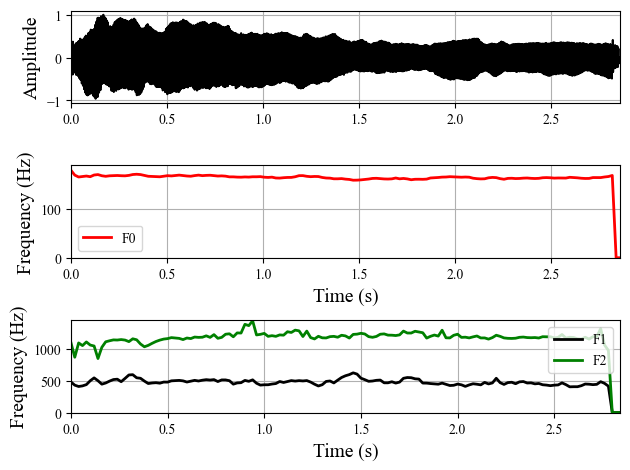

Processing AVPEPUDEA0023_a2.wav:  37%|███▋      | 55/150 [00:19<00:32,  2.88it/s]

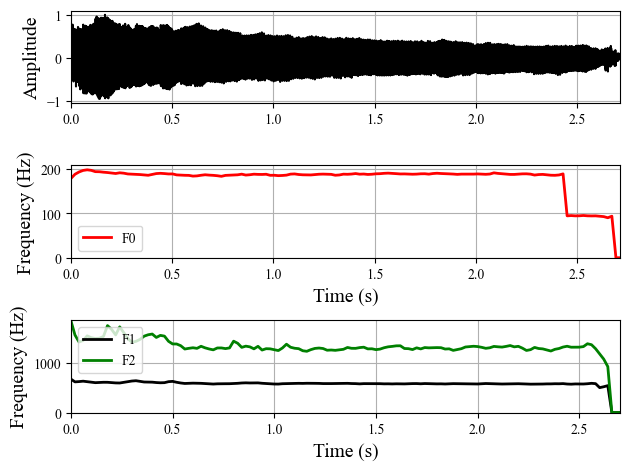

Processing AVPEPUDEA0023_a3.wav:  37%|███▋      | 56/150 [00:19<00:32,  2.92it/s]

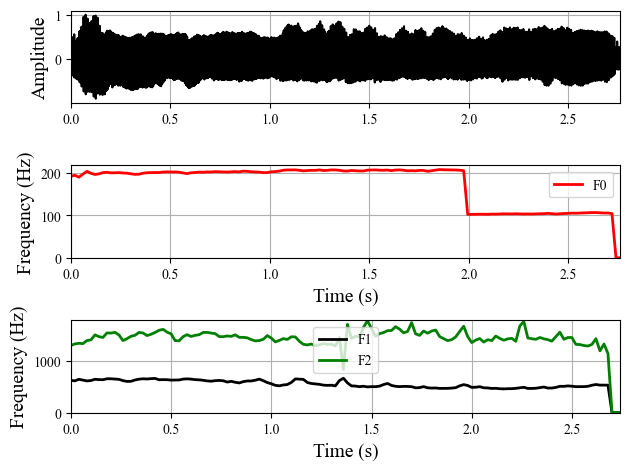

Processing AVPEPUDEA0024_a1.wav:  38%|███▊      | 57/150 [00:20<00:32,  2.84it/s]

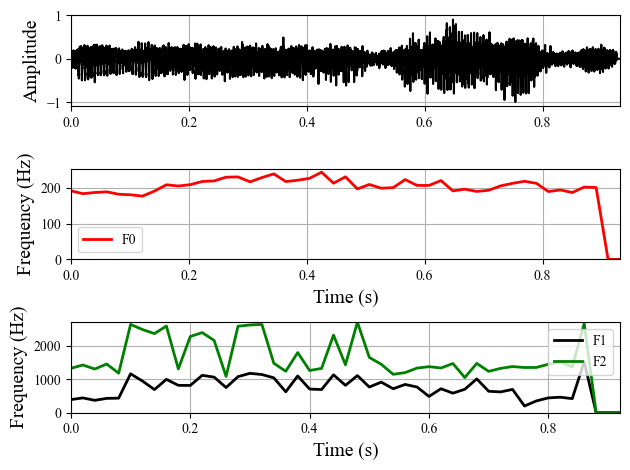

Processing AVPEPUDEA0024_a2.wav:  39%|███▊      | 58/150 [00:20<00:32,  2.83it/s]

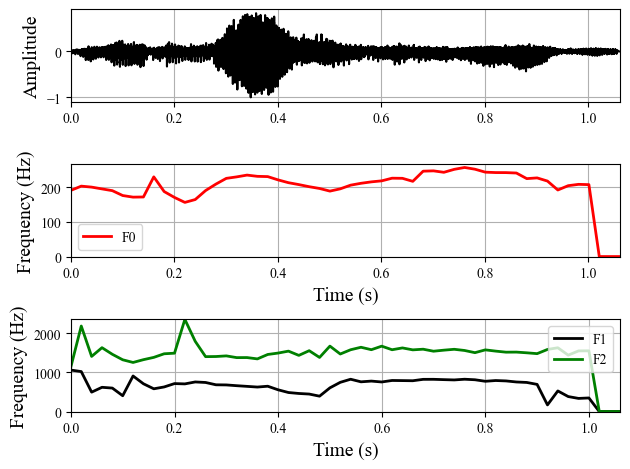

Processing AVPEPUDEA0024_a3.wav:  39%|███▉      | 59/150 [00:20<00:37,  2.45it/s]

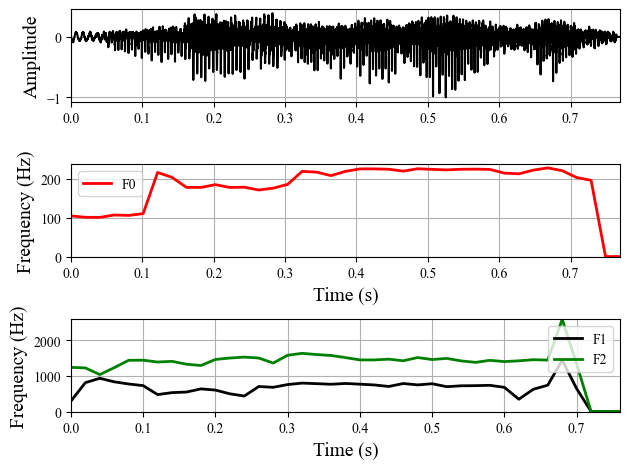

Processing AVPEPUDEA0025_a1.wav:  40%|████      | 60/150 [00:21<00:35,  2.53it/s]

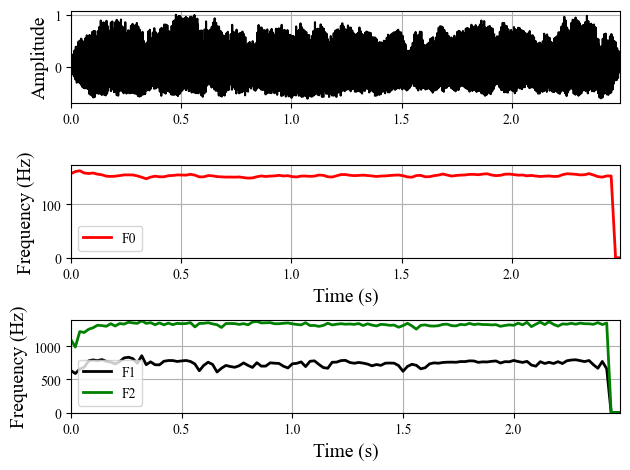

Processing AVPEPUDEA0025_a2.wav:  41%|████      | 61/150 [00:21<00:34,  2.60it/s]

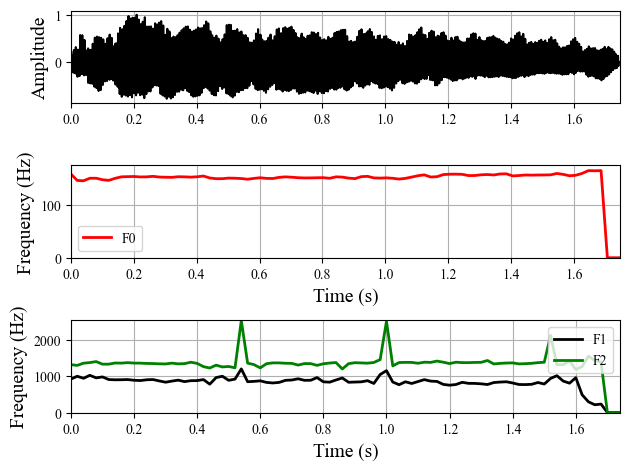

Processing AVPEPUDEA0025_a3.wav:  41%|████▏     | 62/150 [00:22<00:33,  2.59it/s]

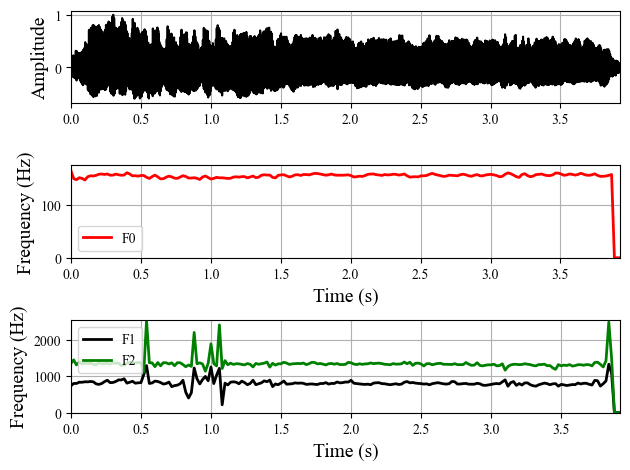

Processing AVPEPUDEA0026_a1.wav:  42%|████▏     | 63/150 [00:22<00:32,  2.65it/s]

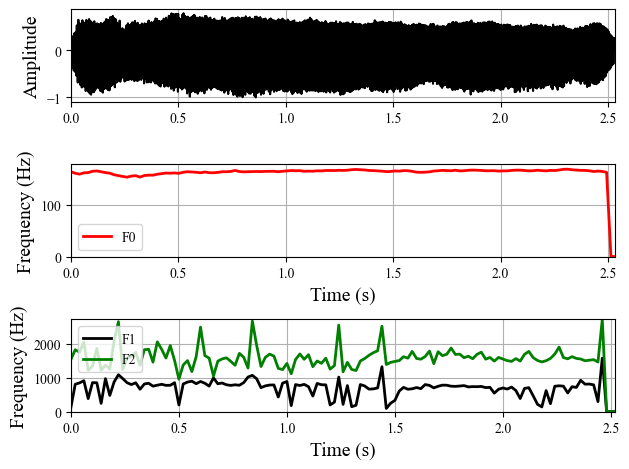

Processing AVPEPUDEA0026_a2.wav:  43%|████▎     | 64/150 [00:22<00:30,  2.78it/s]

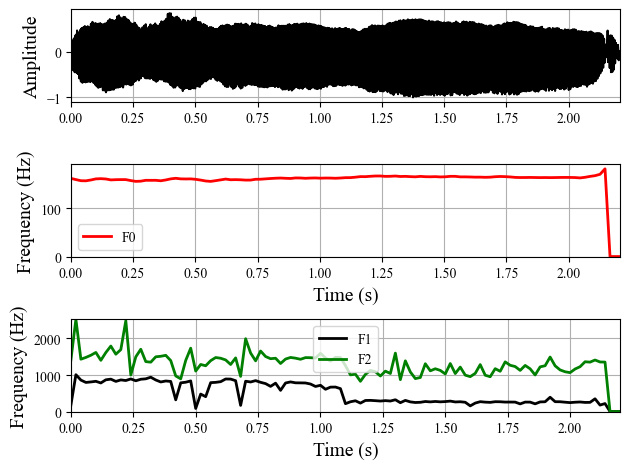

Processing AVPEPUDEA0026_a3.wav:  43%|████▎     | 65/150 [00:23<00:30,  2.77it/s]

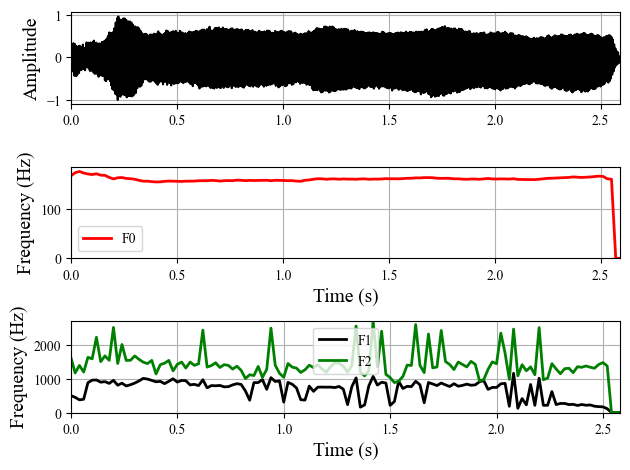

Processing AVPEPUDEA0027_a1.wav:  44%|████▍     | 66/150 [00:23<00:30,  2.75it/s]

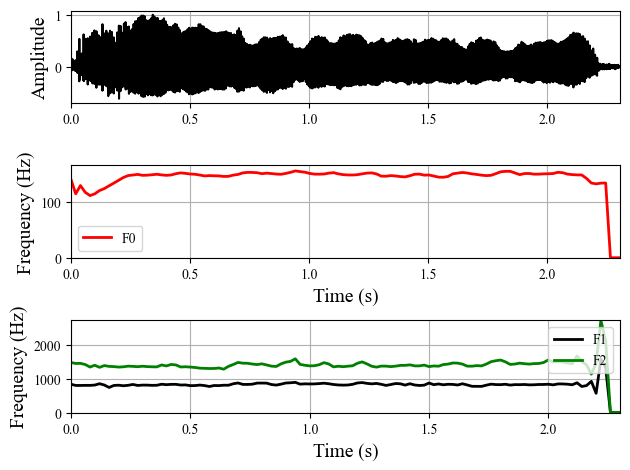

Processing AVPEPUDEA0027_a2.wav:  45%|████▍     | 67/150 [00:23<00:29,  2.79it/s]

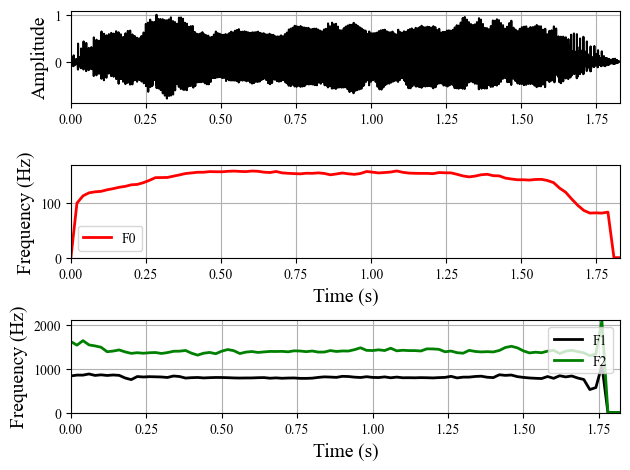

Processing AVPEPUDEA0027_a3.wav:  45%|████▌     | 68/150 [00:24<00:28,  2.88it/s]

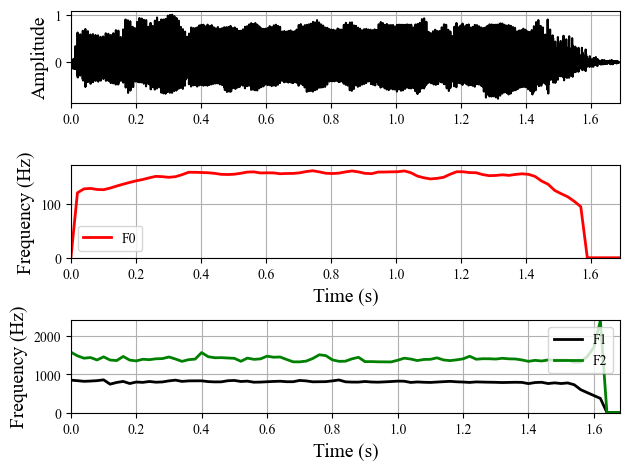

Processing AVPEPUDEA0029_a1.wav:  46%|████▌     | 69/150 [00:24<00:27,  2.92it/s]

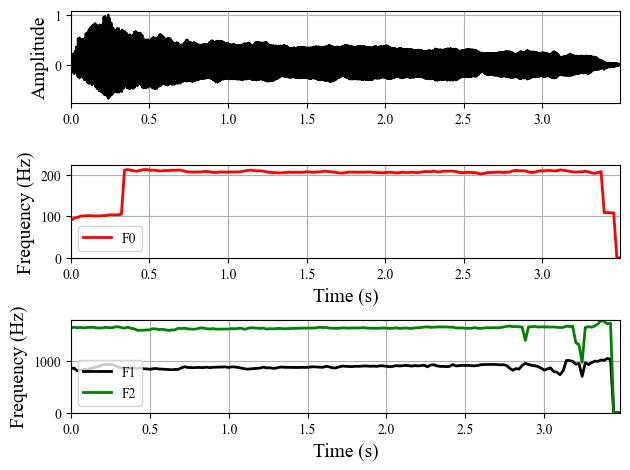

Processing AVPEPUDEA0029_a2.wav:  47%|████▋     | 70/150 [00:24<00:27,  2.95it/s]

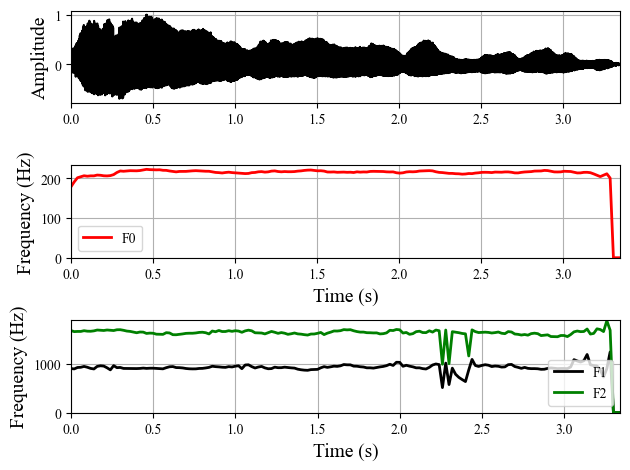

Processing AVPEPUDEA0029_a3.wav:  47%|████▋     | 71/150 [00:25<00:27,  2.90it/s]

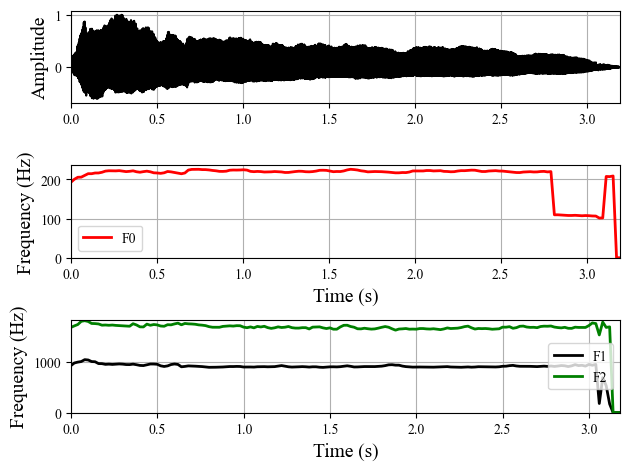

/localhome/studenter/malinre/miniconda3/envs/disenv/lib/python3.11/site-packages/disvoice/glottal/../utils.py:50: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  sk.append(st.skew(k))
/localhome/studenter/malinre/miniconda3/envs/disenv/lib/python3.11/site-packages/disvoice/glottal/../utils.py:51: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  ku.append(st.kurtosis(k))
Processing AVPEPUDEA0030_a1.wav:  48%|████▊     | 72/150 [00:25<00:26,  2.94it/s]

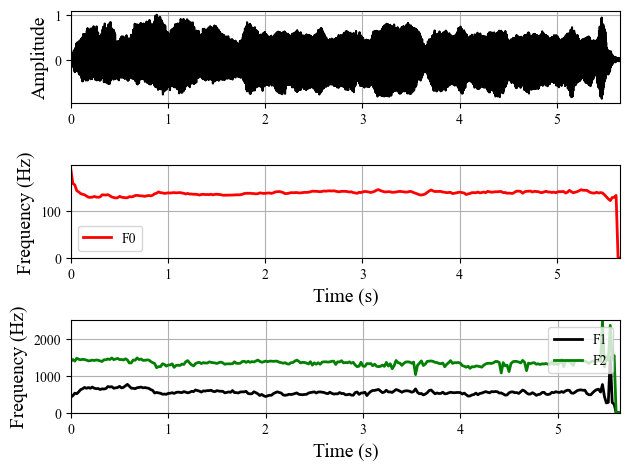

Processing AVPEPUDEA0030_a2.wav:  49%|████▊     | 73/150 [00:25<00:27,  2.83it/s]

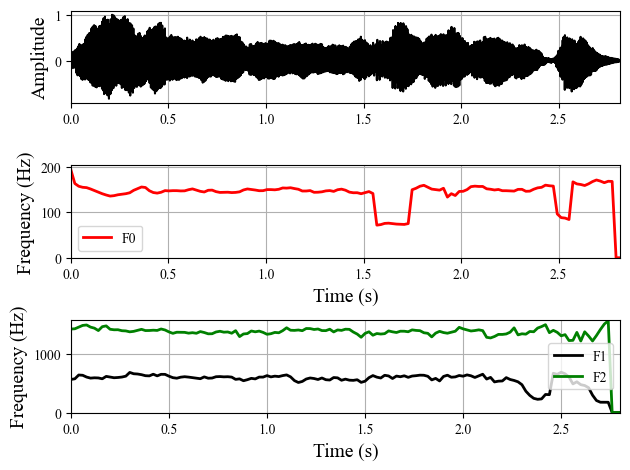

Processing AVPEPUDEA0030_a3.wav:  49%|████▉     | 74/150 [00:26<00:27,  2.81it/s]

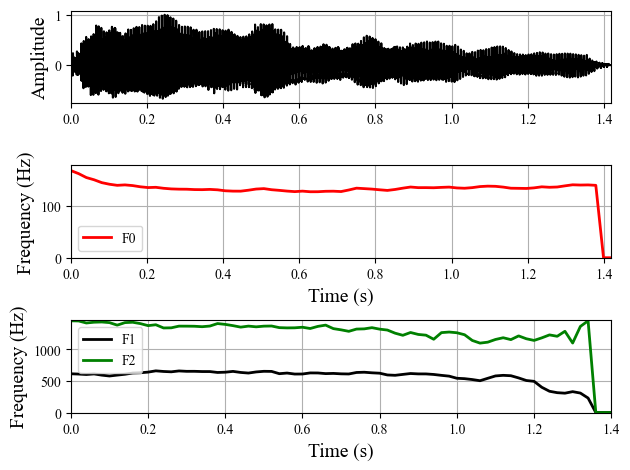

Processing AVPEPUDEA0031_a1.wav:  50%|█████     | 75/150 [00:26<00:26,  2.78it/s]

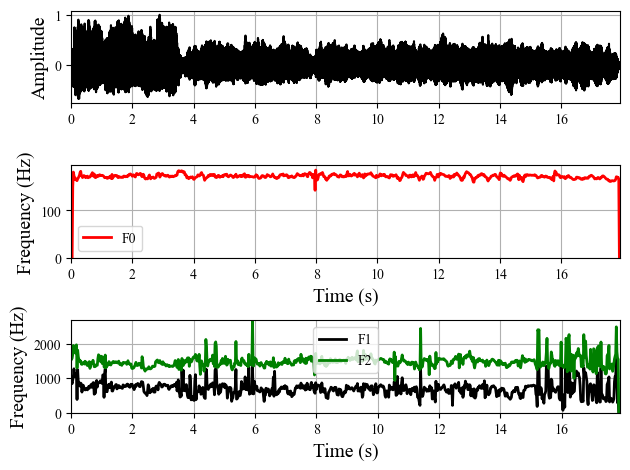

Processing AVPEPUDEA0031_a2.wav:  51%|█████     | 76/150 [00:27<00:30,  2.46it/s]

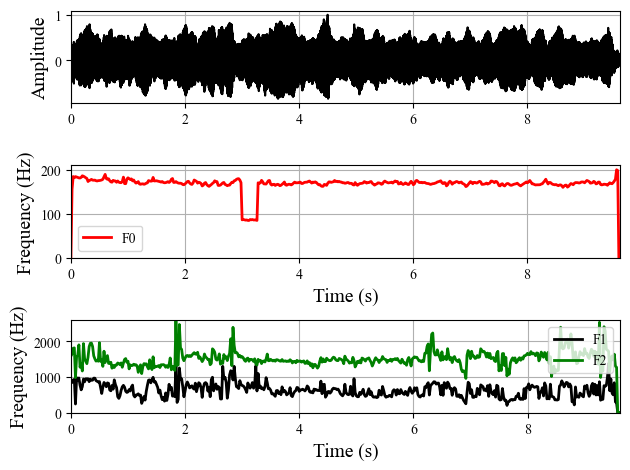

Processing AVPEPUDEA0031_a3.wav:  51%|█████▏    | 77/150 [00:27<00:29,  2.47it/s]

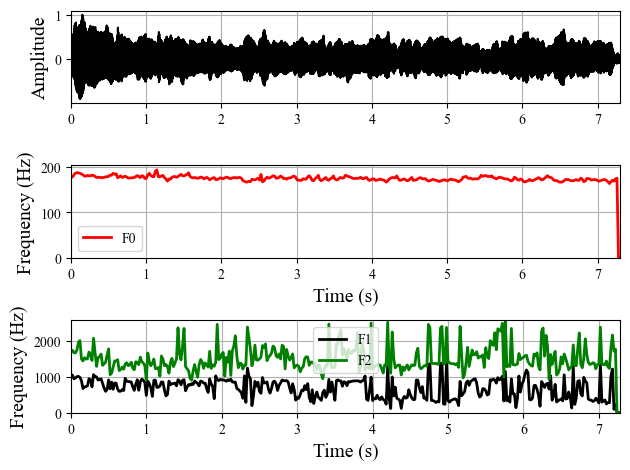

Processing AVPEPUDEA0032_a1.wav:  52%|█████▏    | 78/150 [00:27<00:28,  2.52it/s]

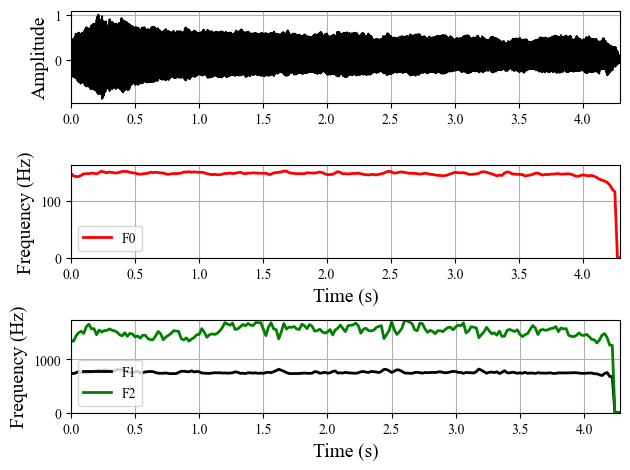

Processing AVPEPUDEA0032_a2.wav:  53%|█████▎    | 79/150 [00:28<00:31,  2.23it/s]

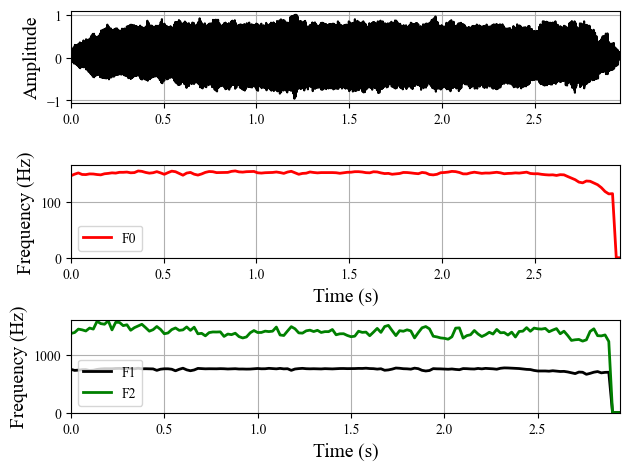

Processing AVPEPUDEA0032_a3.wav:  53%|█████▎    | 80/150 [00:28<00:29,  2.36it/s]

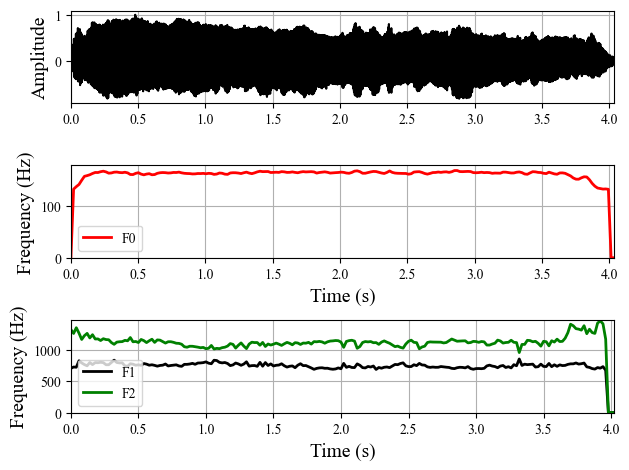

Processing AVPEPUDEA0034_a1.wav:  54%|█████▍    | 81/150 [00:29<00:28,  2.40it/s]

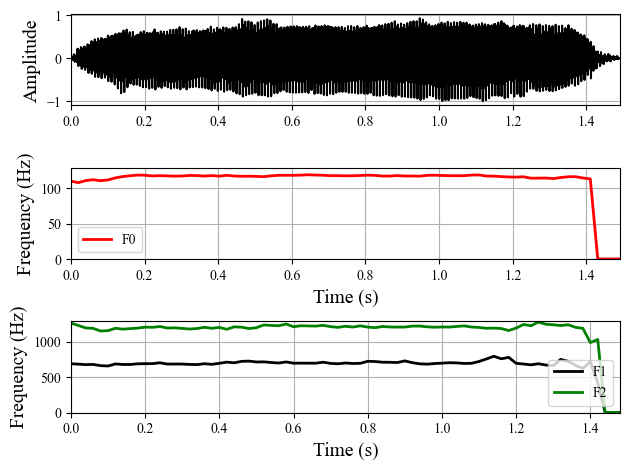

Processing AVPEPUDEA0034_a2.wav:  55%|█████▍    | 82/150 [00:29<00:27,  2.47it/s]

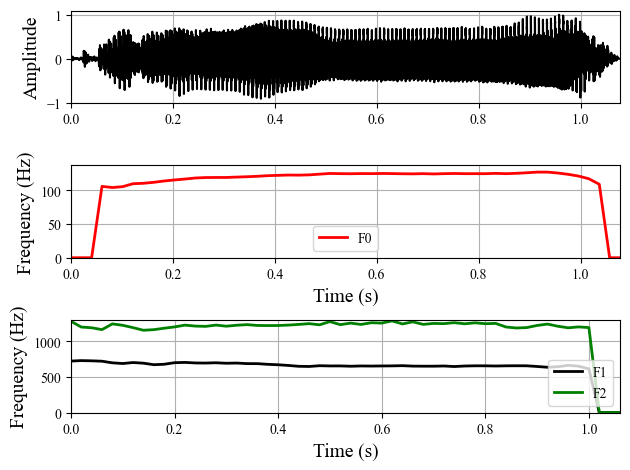

Processing AVPEPUDEA0034_a3.wav:  55%|█████▌    | 83/150 [00:29<00:25,  2.65it/s]

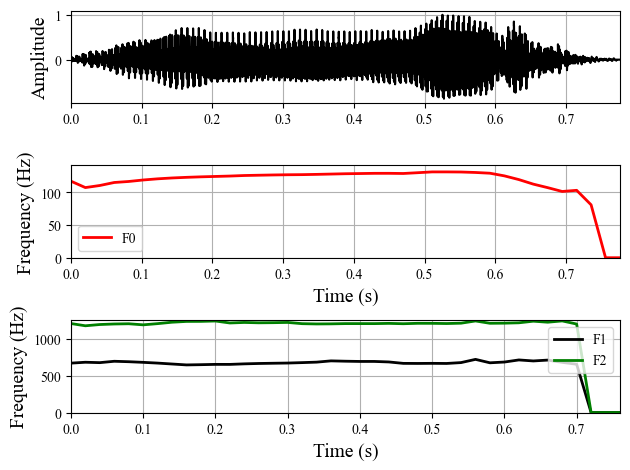

Processing AVPEPUDEA0035_a1.wav:  56%|█████▌    | 84/150 [00:30<00:23,  2.76it/s]

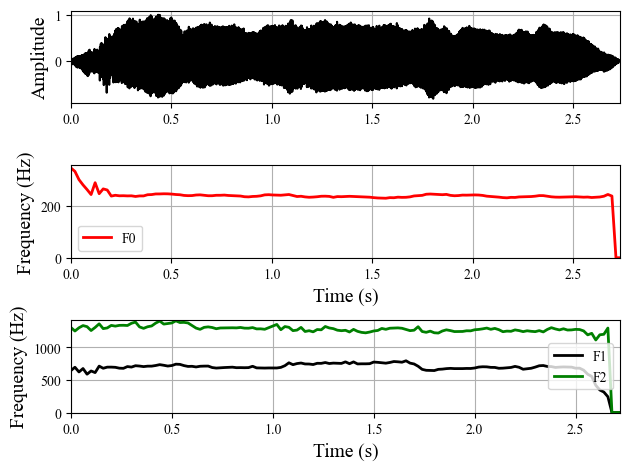

Processing AVPEPUDEA0035_a2.wav:  57%|█████▋    | 85/150 [00:30<00:23,  2.78it/s]

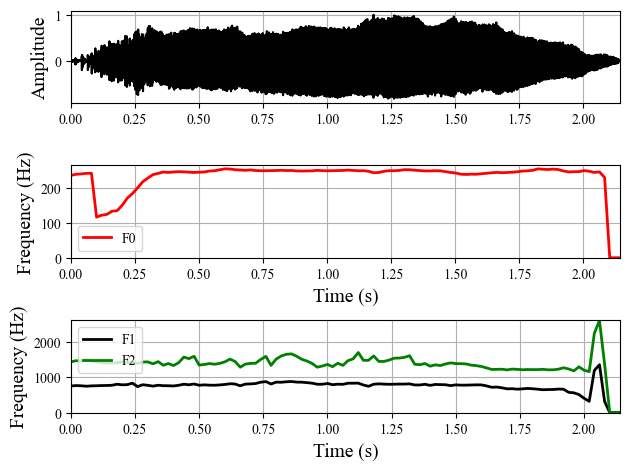

Processing AVPEPUDEA0035_a3.wav:  57%|█████▋    | 86/150 [00:30<00:22,  2.86it/s]

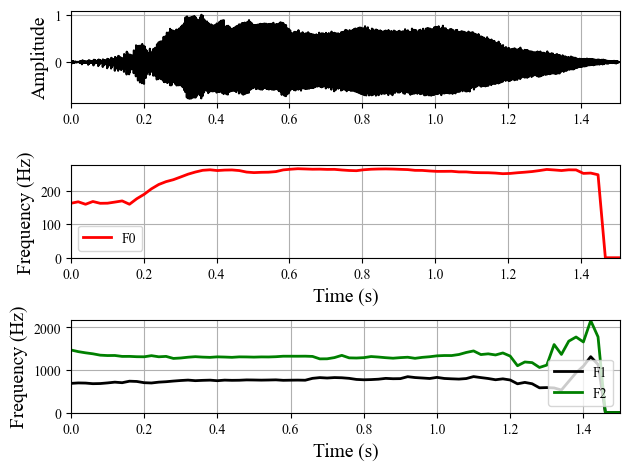

Processing AVPEPUDEA0037_a1.wav:  58%|█████▊    | 87/150 [00:31<00:21,  2.97it/s]

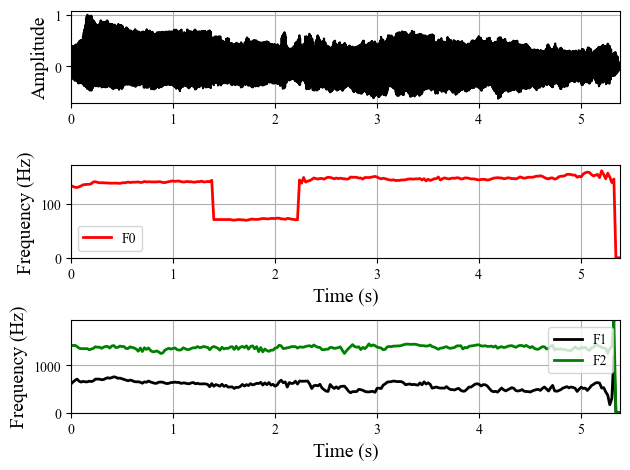

Processing AVPEPUDEA0037_a2.wav:  59%|█████▊    | 88/150 [00:31<00:21,  2.93it/s]

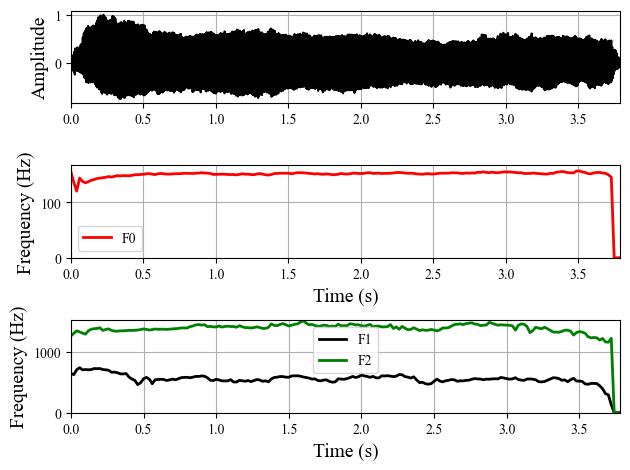

Processing AVPEPUDEA0037_a3.wav:  59%|█████▉    | 89/150 [00:31<00:20,  2.97it/s]

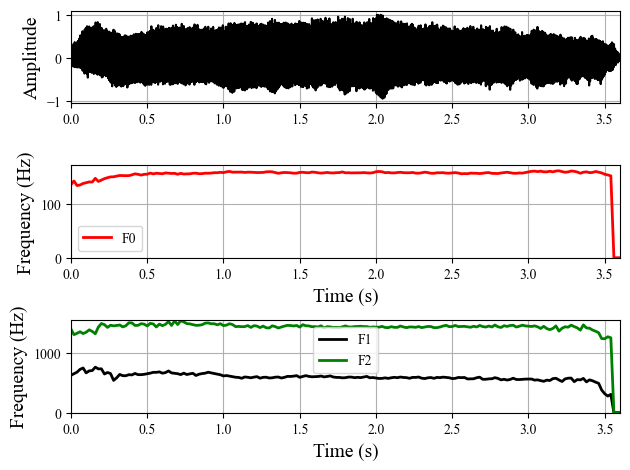

Processing AVPEPUDEA0038_a1.wav:  60%|██████    | 90/150 [00:32<00:21,  2.85it/s]

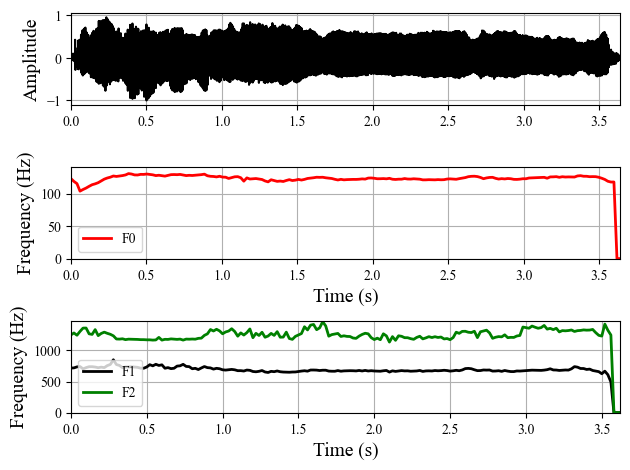

Processing AVPEPUDEA0038_a2.wav:  61%|██████    | 91/150 [00:32<00:21,  2.78it/s]

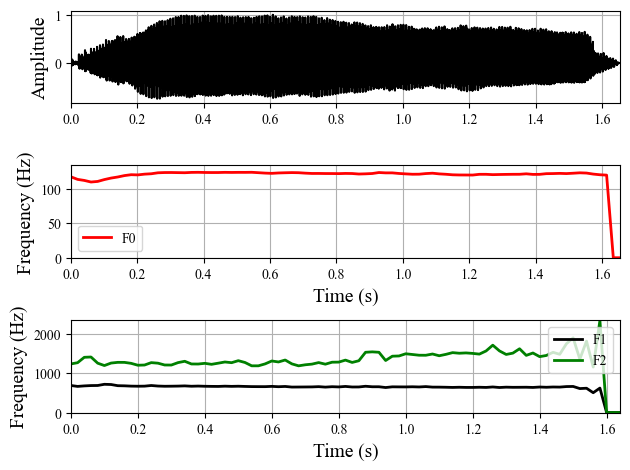

Processing AVPEPUDEA0038_a3.wav:  61%|██████▏   | 92/150 [00:33<00:20,  2.88it/s]

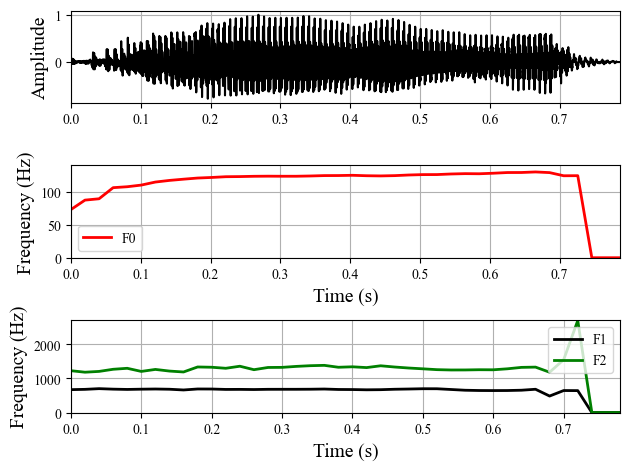

Processing AVPEPUDEA0039_a1.wav:  62%|██████▏   | 93/150 [00:33<00:19,  2.86it/s]

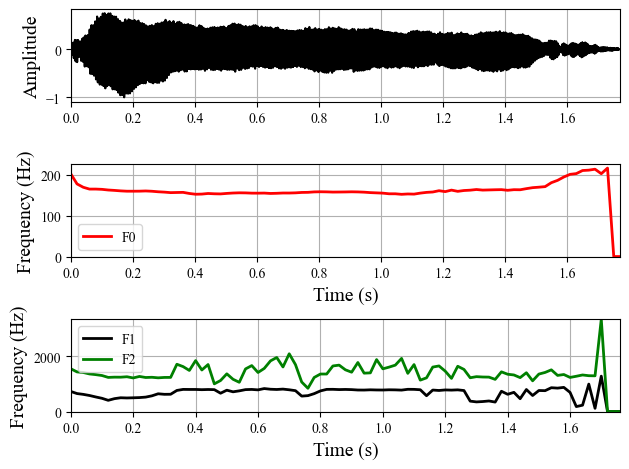

Processing AVPEPUDEA0039_a2.wav:  63%|██████▎   | 94/150 [00:33<00:18,  2.96it/s]

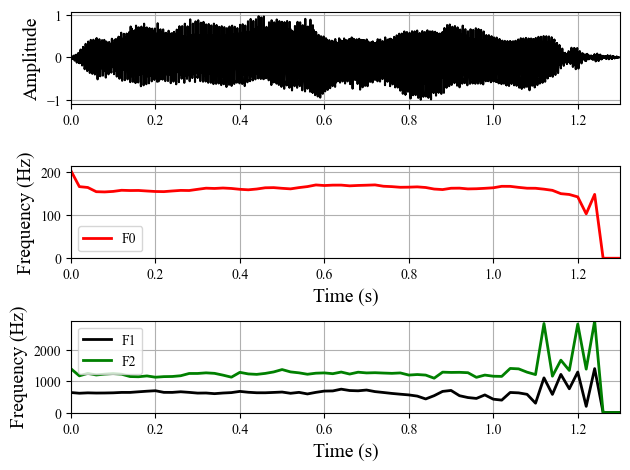

Processing AVPEPUDEA0039_a3.wav:  63%|██████▎   | 95/150 [00:33<00:17,  3.07it/s]

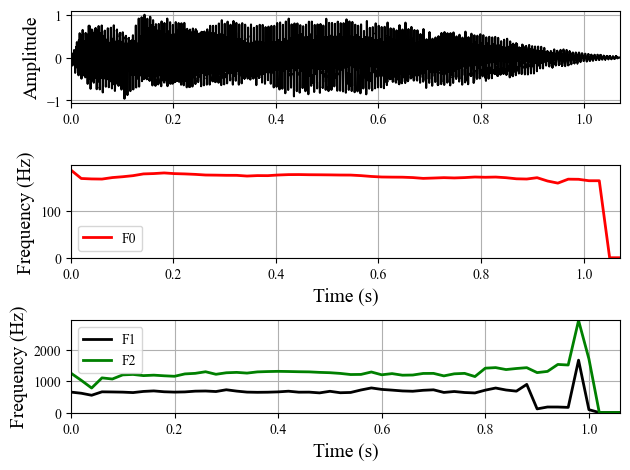

Processing AVPEPUDEA0041_a1.wav:  64%|██████▍   | 96/150 [00:34<00:18,  2.87it/s]

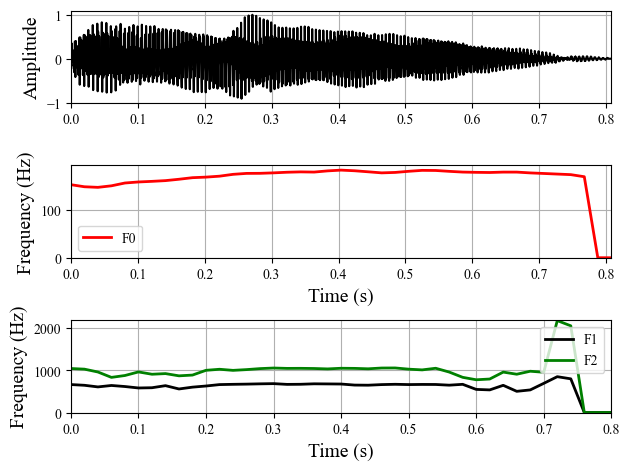

Processing AVPEPUDEA0041_a2.wav:  65%|██████▍   | 97/150 [00:34<00:17,  2.97it/s]

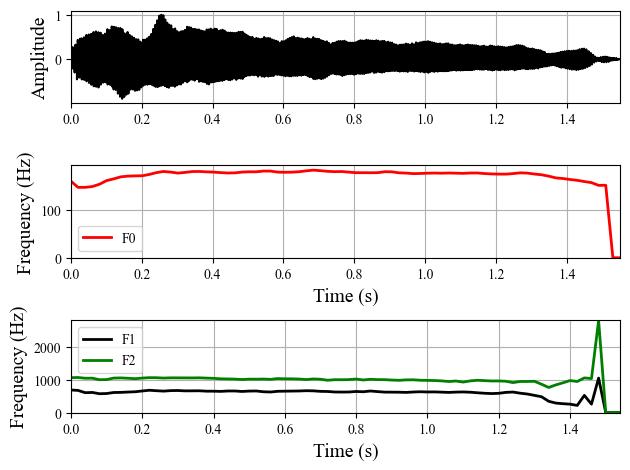

Processing AVPEPUDEA0041_a3.wav:  65%|██████▌   | 98/150 [00:35<00:20,  2.52it/s]

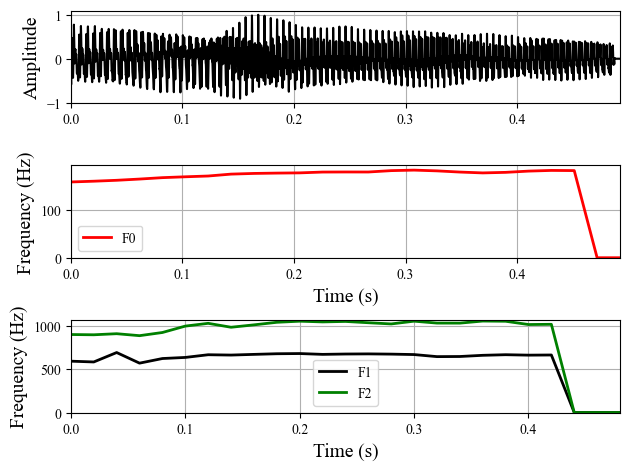

Processing AVPEPUDEA0042_a1.wav:  66%|██████▌   | 99/150 [00:35<00:18,  2.77it/s]

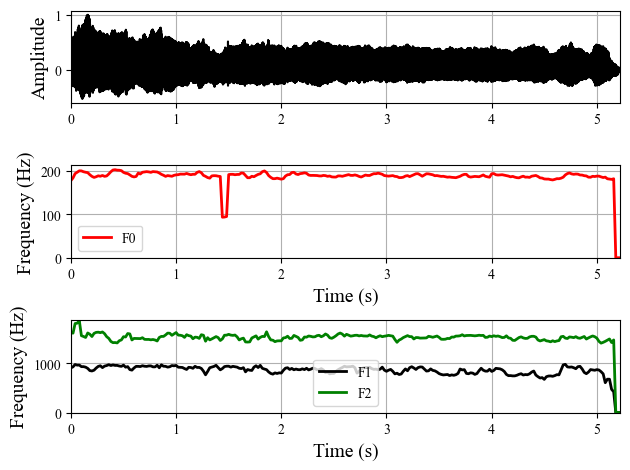

Processing AVPEPUDEA0042_a2.wav:  67%|██████▋   | 100/150 [00:35<00:18,  2.66it/s]

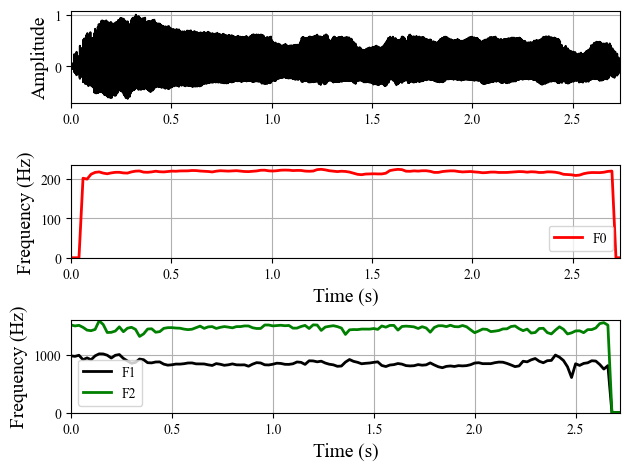

Processing AVPEPUDEA0042_a3.wav:  67%|██████▋   | 101/150 [00:36<00:18,  2.62it/s]

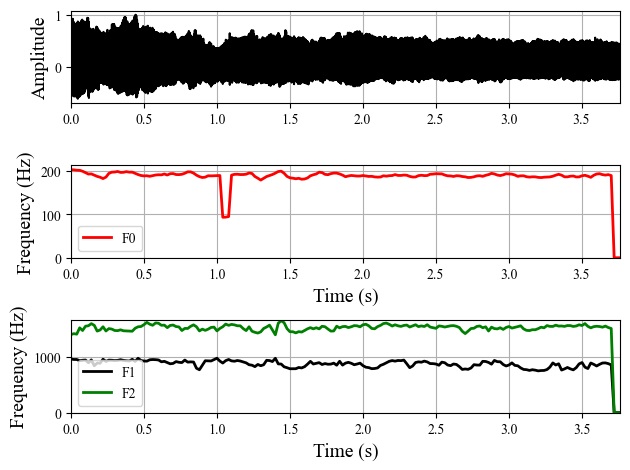

Processing AVPEPUDEA0043_a1.wav:  68%|██████▊   | 102/150 [00:36<00:19,  2.48it/s]

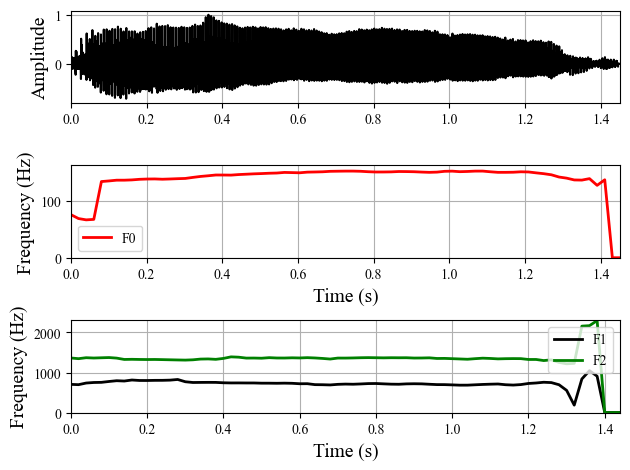

Processing AVPEPUDEA0043_a2.wav:  69%|██████▊   | 103/150 [00:37<00:17,  2.65it/s]

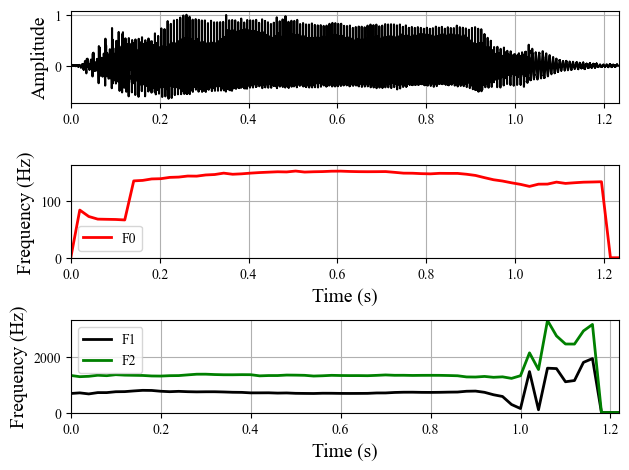

Processing AVPEPUDEA0043_a3.wav:  69%|██████▉   | 104/150 [00:37<00:16,  2.82it/s]

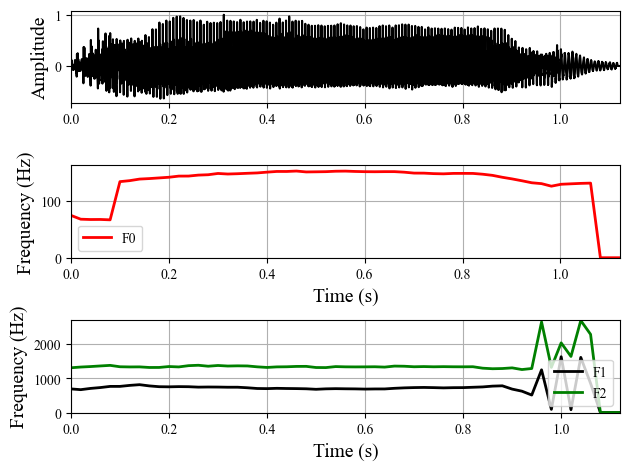

Processing AVPEPUDEA0045_a1.wav:  70%|███████   | 105/150 [00:37<00:15,  2.98it/s]

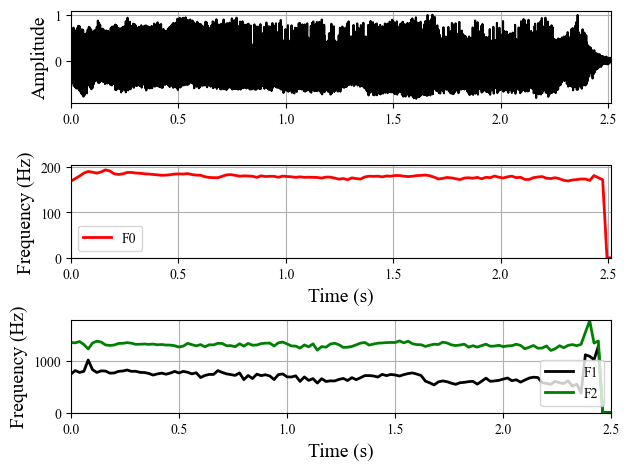

Processing AVPEPUDEA0045_a2.wav:  71%|███████   | 106/150 [00:37<00:14,  3.01it/s]

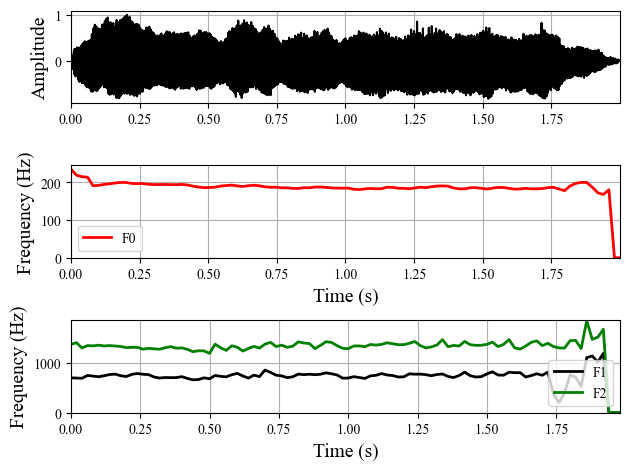

Processing AVPEPUDEA0045_a3.wav:  71%|███████▏  | 107/150 [00:38<00:14,  2.98it/s]

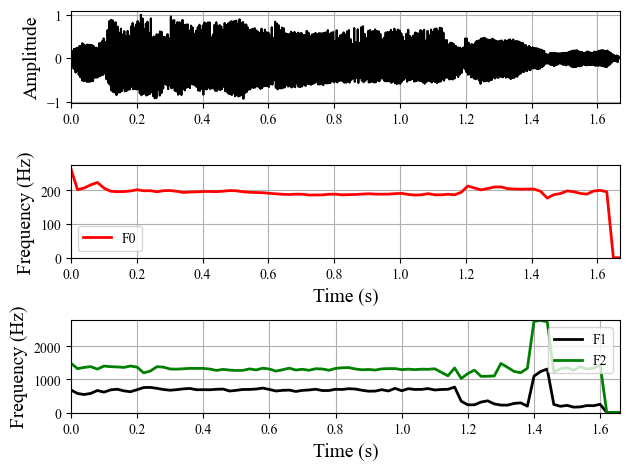

Processing AVPEPUDEA0046_a1.wav:  72%|███████▏  | 108/150 [00:38<00:14,  2.95it/s]

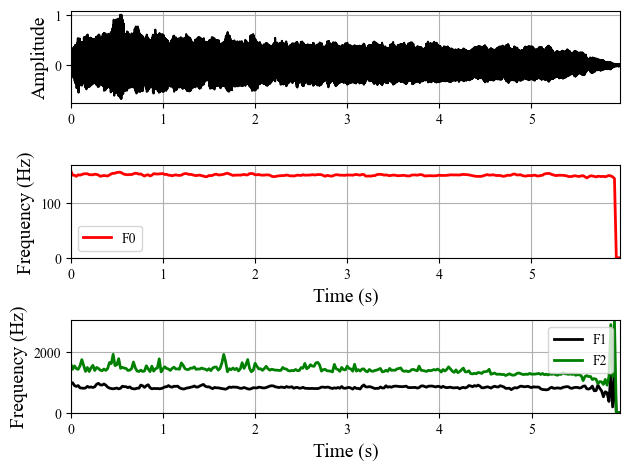

Processing AVPEPUDEA0046_a2.wav:  73%|███████▎  | 109/150 [00:39<00:14,  2.86it/s]

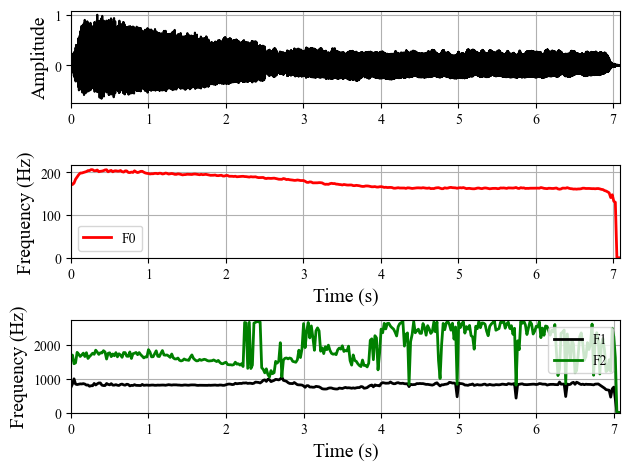

Processing AVPEPUDEA0046_a3.wav:  73%|███████▎  | 110/150 [00:39<00:14,  2.69it/s]

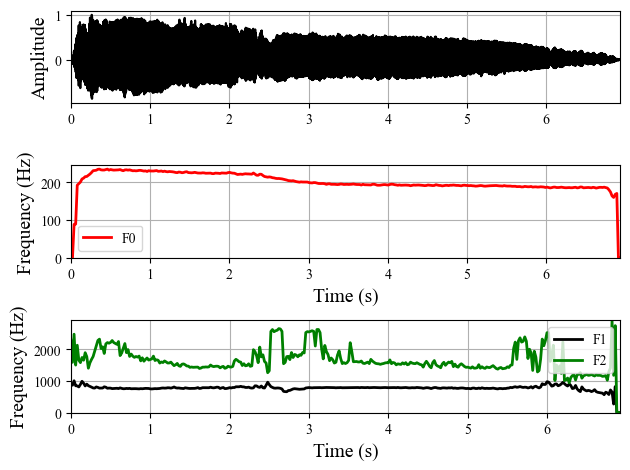

Processing AVPEPUDEA0047_a1.wav:  74%|███████▍  | 111/150 [00:39<00:15,  2.55it/s]

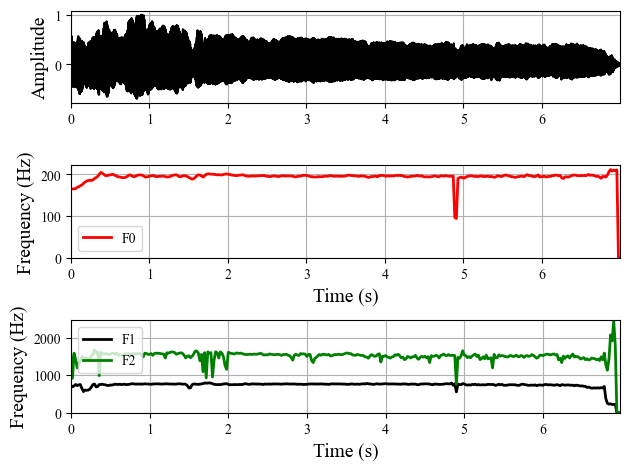

Processing AVPEPUDEA0047_a2.wav:  75%|███████▍  | 112/150 [00:40<00:14,  2.57it/s]

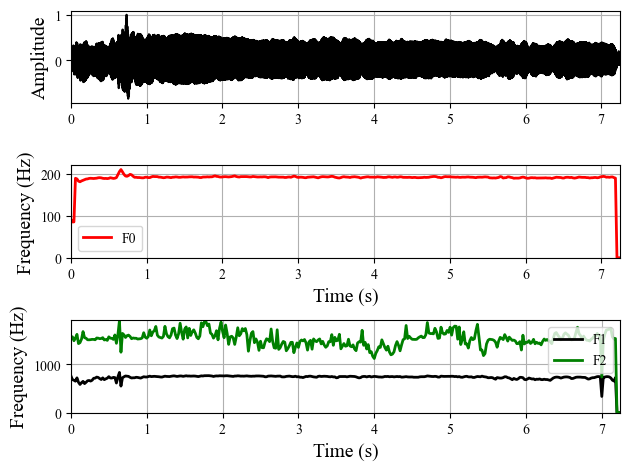

Processing AVPEPUDEA0047_a3.wav:  75%|███████▌  | 113/150 [00:40<00:14,  2.55it/s]

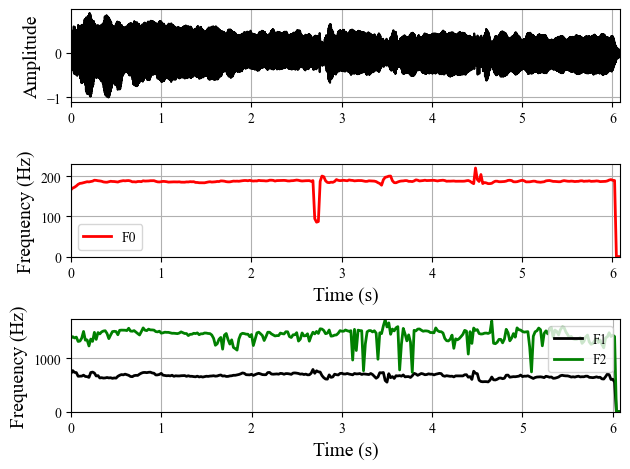

Processing AVPEPUDEA0048_a1.wav:  76%|███████▌  | 114/150 [00:41<00:14,  2.50it/s]

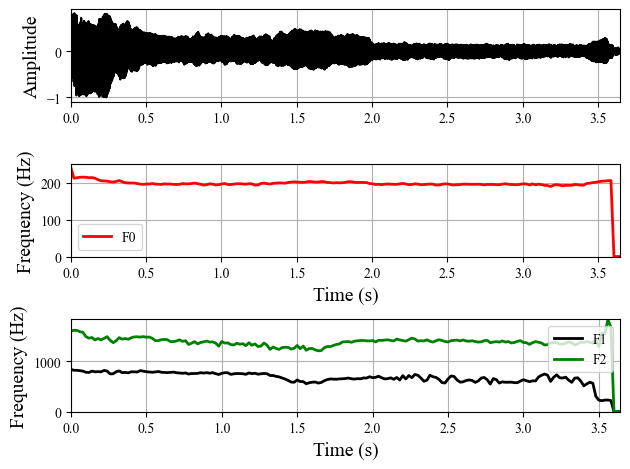

Processing AVPEPUDEA0048_a2.wav:  77%|███████▋  | 115/150 [00:41<00:13,  2.61it/s]

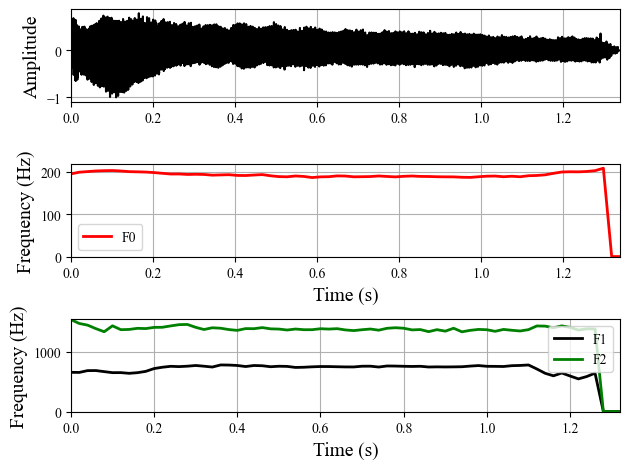

Processing AVPEPUDEA0048_a3.wav:  77%|███████▋  | 116/150 [00:41<00:12,  2.67it/s]

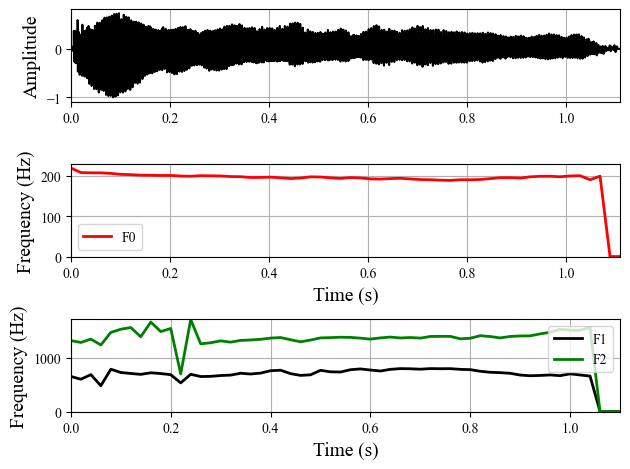

Processing AVPEPUDEA0049_a1.wav:  78%|███████▊  | 117/150 [00:42<00:11,  2.81it/s]

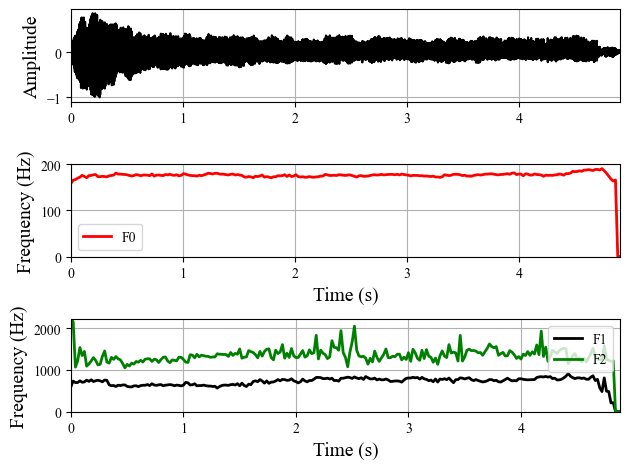

Processing AVPEPUDEA0049_a2.wav:  79%|███████▊  | 118/150 [00:42<00:11,  2.83it/s]

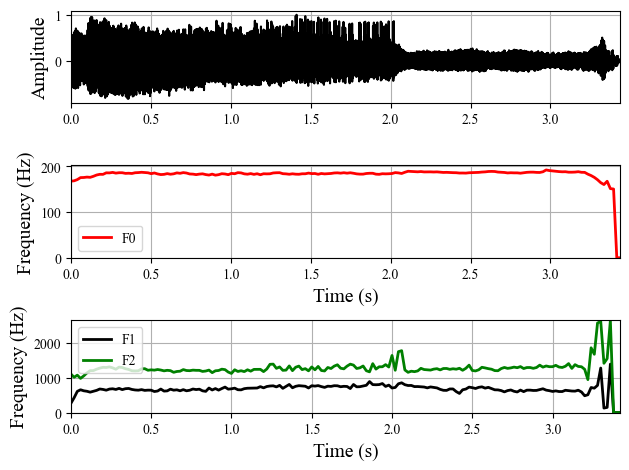

Processing AVPEPUDEA0049_a3.wav:  79%|███████▉  | 119/150 [00:43<00:12,  2.43it/s]

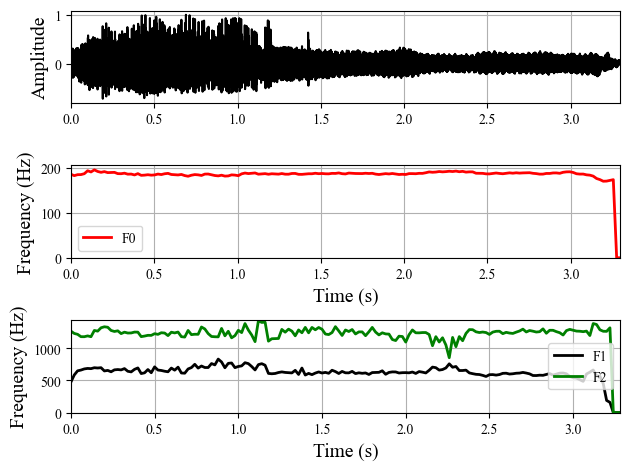

Processing AVPEPUDEA0050_a1.wav:  80%|████████  | 120/150 [00:43<00:11,  2.53it/s]

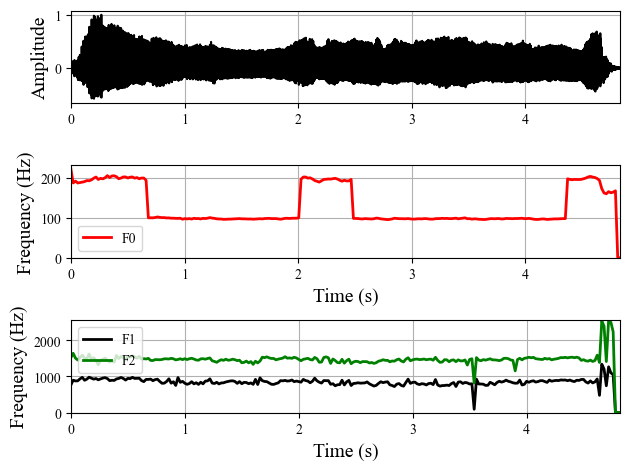

Processing AVPEPUDEA0050_a2.wav:  81%|████████  | 121/150 [00:43<00:11,  2.60it/s]

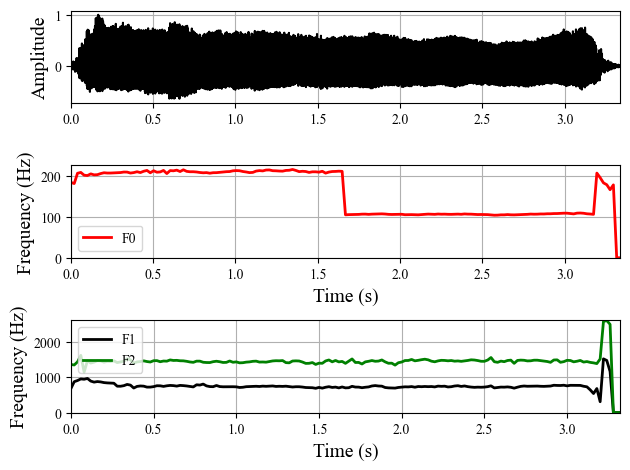

Processing AVPEPUDEA0050_a3.wav:  81%|████████▏ | 122/150 [00:44<00:10,  2.67it/s]

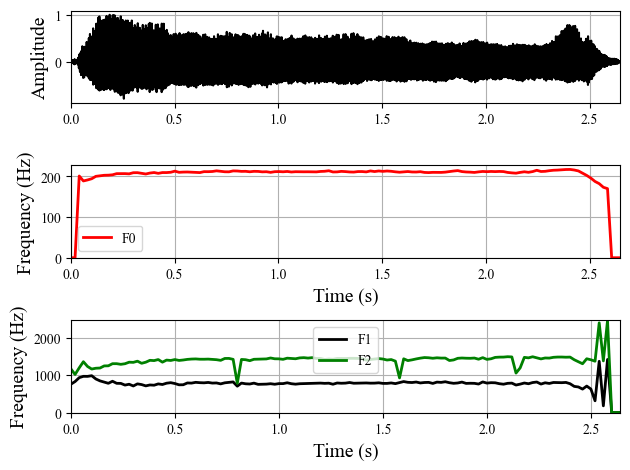

Processing AVPEPUDEA0051_a1.wav:  82%|████████▏ | 123/150 [00:44<00:09,  2.76it/s]

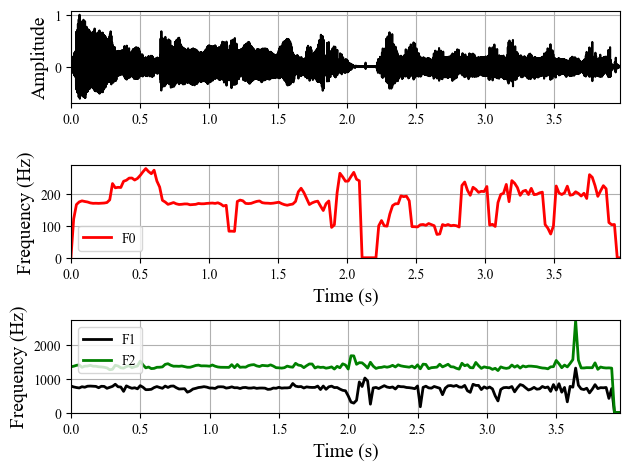

Processing AVPEPUDEA0051_a2.wav:  83%|████████▎ | 124/150 [00:44<00:09,  2.75it/s]

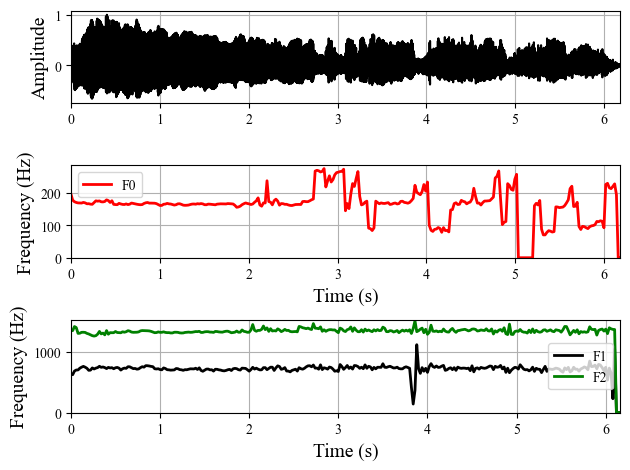

Processing AVPEPUDEA0051_a3.wav:  83%|████████▎ | 125/150 [00:45<00:09,  2.60it/s]

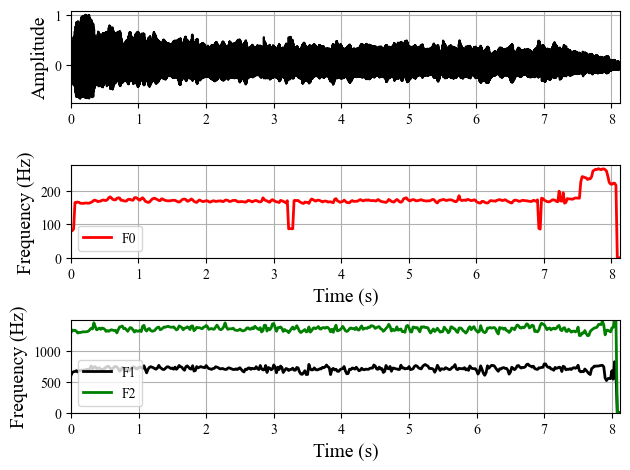

Processing AVPEPUDEA0052_a1.wav:  84%|████████▍ | 126/150 [00:45<00:09,  2.46it/s]

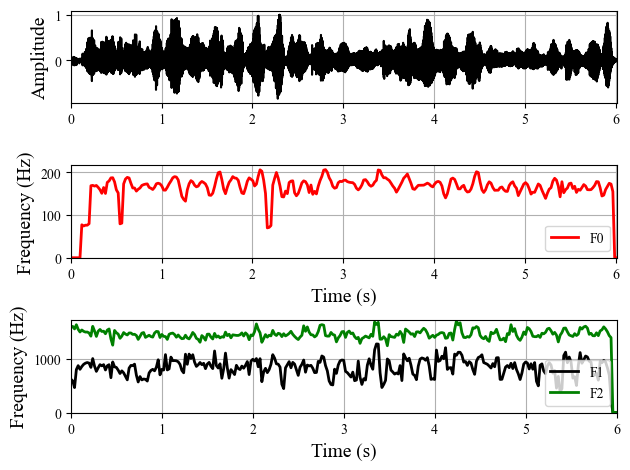

Processing AVPEPUDEA0052_a2.wav:  85%|████████▍ | 127/150 [00:46<00:09,  2.44it/s]

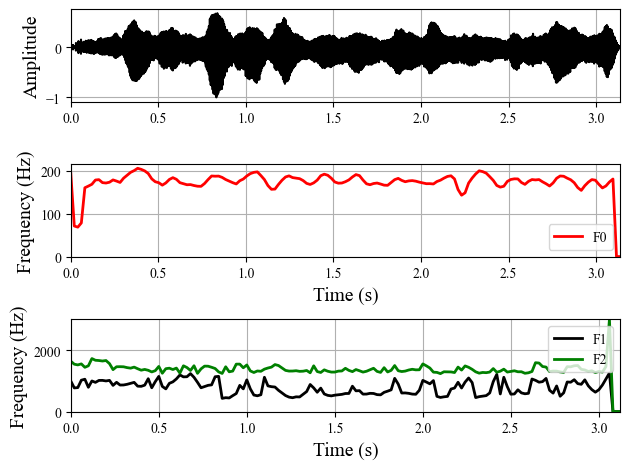

Processing AVPEPUDEA0052_a3.wav:  85%|████████▌ | 128/150 [00:46<00:08,  2.54it/s]

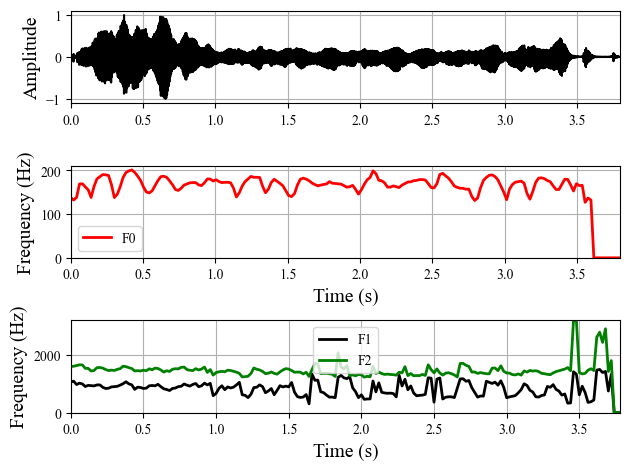

Processing AVPEPUDEA0053_a1.wav:  86%|████████▌ | 129/150 [00:46<00:08,  2.55it/s]

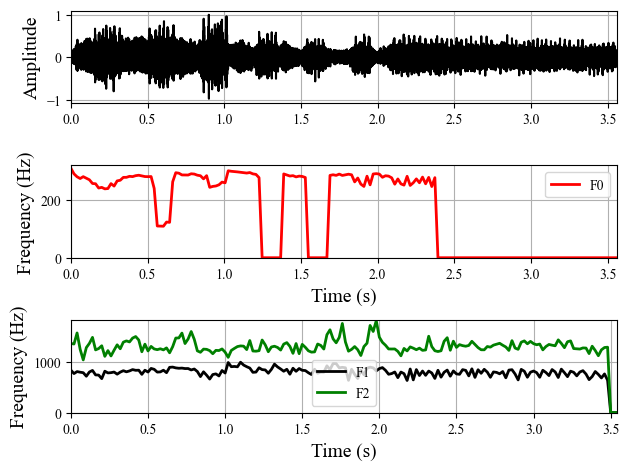

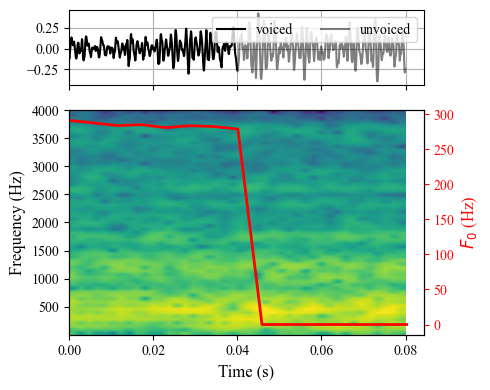

Processing AVPEPUDEA0053_a2.wav:  87%|████████▋ | 130/150 [00:47<00:09,  2.04it/s]

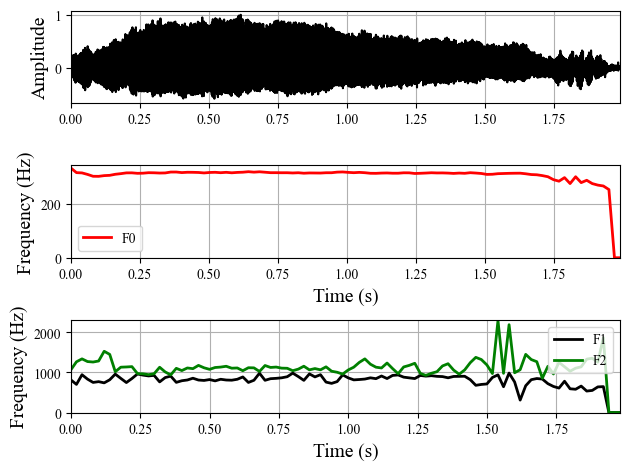

Processing AVPEPUDEA0053_a3.wav:  87%|████████▋ | 131/150 [00:47<00:08,  2.12it/s]

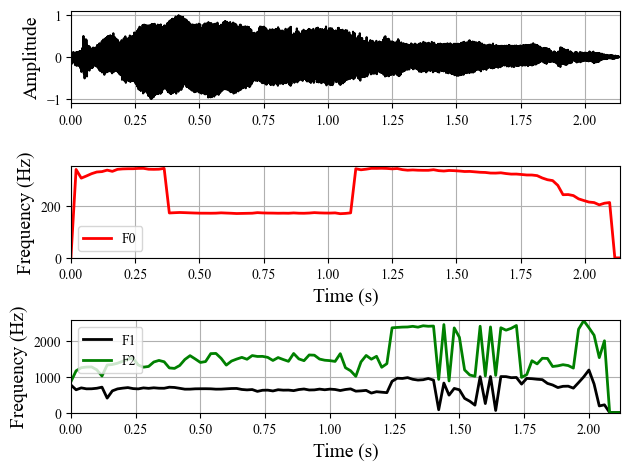

Processing AVPEPUDEA0054_a1.wav:  88%|████████▊ | 132/150 [00:48<00:07,  2.31it/s]

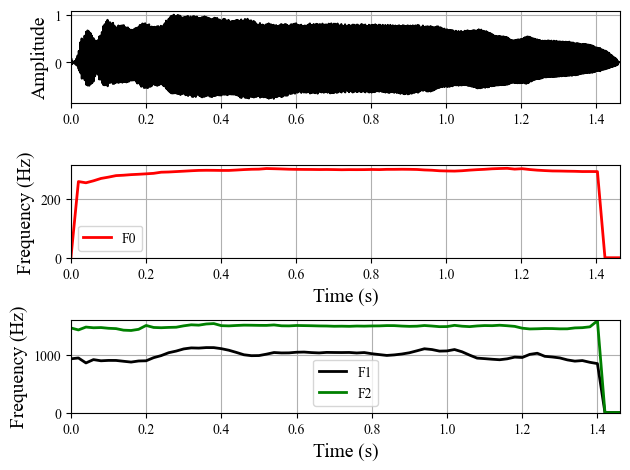

Processing AVPEPUDEA0054_a2.wav:  89%|████████▊ | 133/150 [00:48<00:07,  2.27it/s]

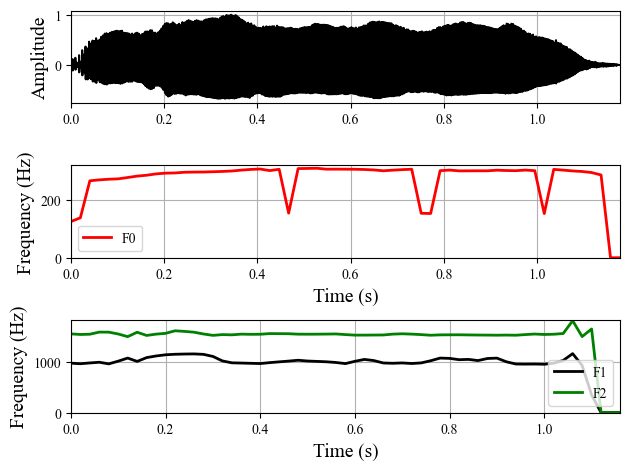

Processing AVPEPUDEA0054_a3.wav:  89%|████████▉ | 134/150 [00:49<00:06,  2.42it/s]

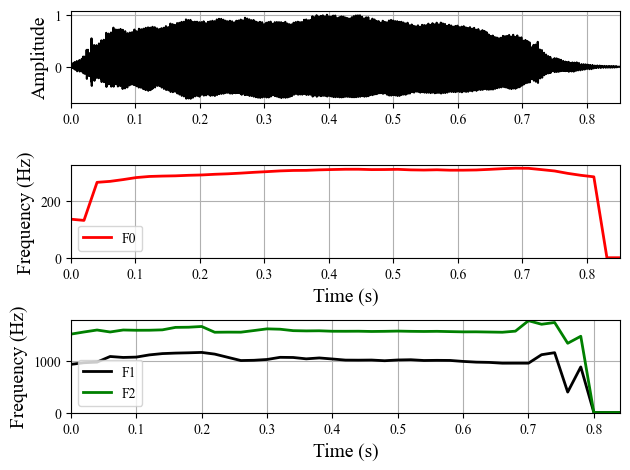

Processing AVPEPUDEA0055_a1.wav:  90%|█████████ | 135/150 [00:49<00:06,  2.44it/s]

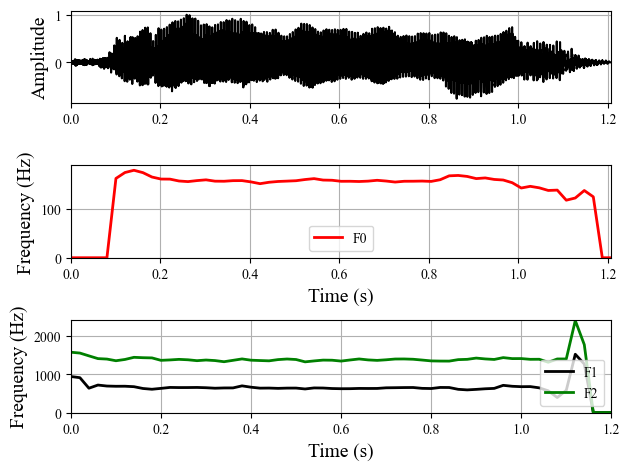

Processing AVPEPUDEA0055_a2.wav:  91%|█████████ | 136/150 [00:49<00:05,  2.58it/s]

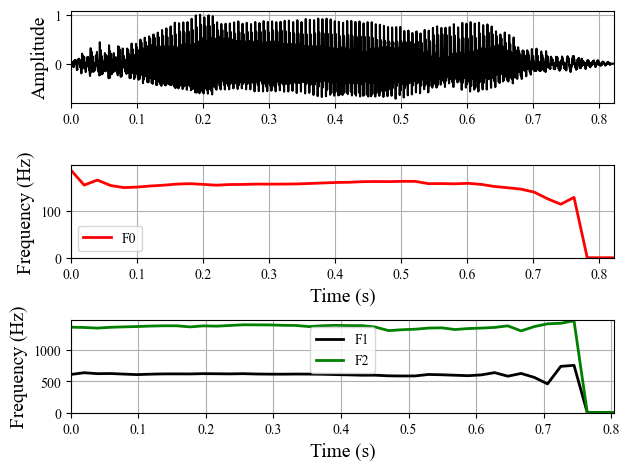

Processing AVPEPUDEA0055_a3.wav:  91%|█████████▏| 137/150 [00:50<00:04,  2.73it/s]

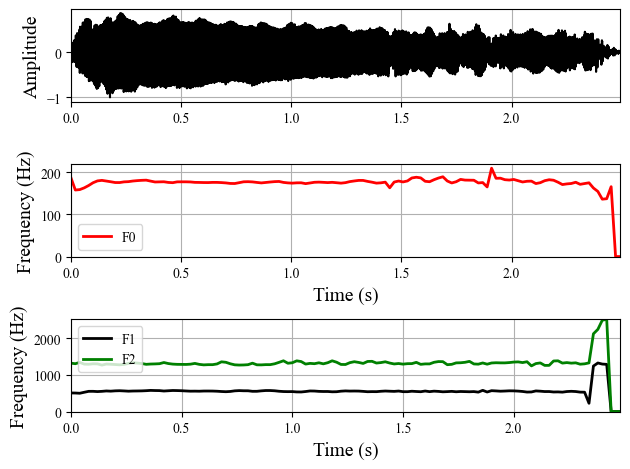

Processing AVPEPUDEA0056_a1.wav:  92%|█████████▏| 138/150 [00:50<00:04,  2.45it/s]

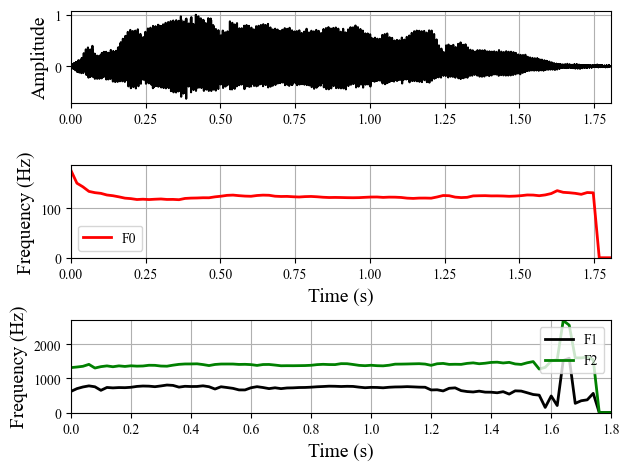

Processing AVPEPUDEA0056_a2.wav:  93%|█████████▎| 139/150 [00:51<00:04,  2.50it/s]

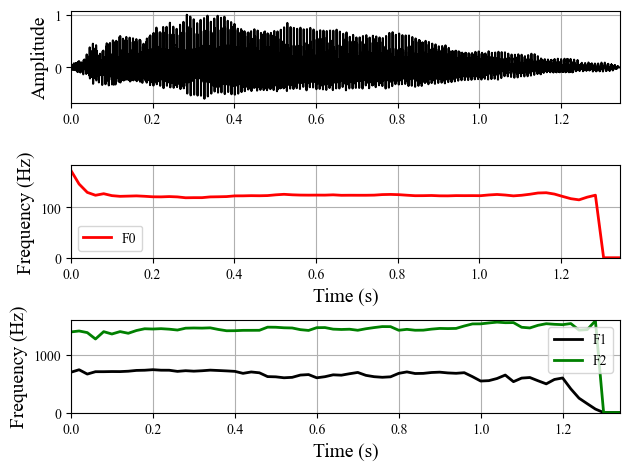

Processing AVPEPUDEA0056_a3.wav:  93%|█████████▎| 140/150 [00:51<00:03,  2.69it/s]

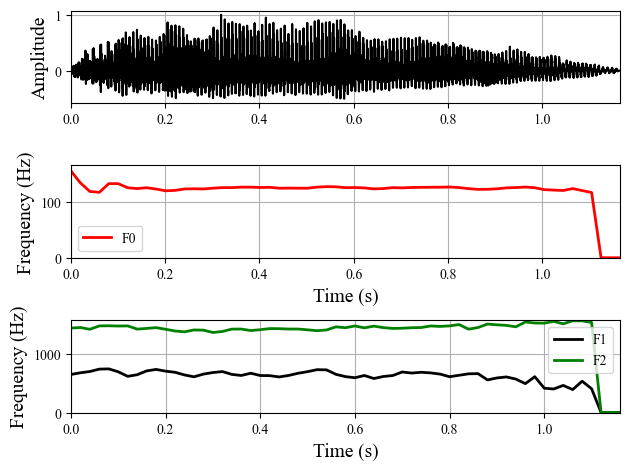

Processing AVPEPUDEA0057_a1.wav:  94%|█████████▍| 141/150 [00:51<00:03,  2.72it/s]

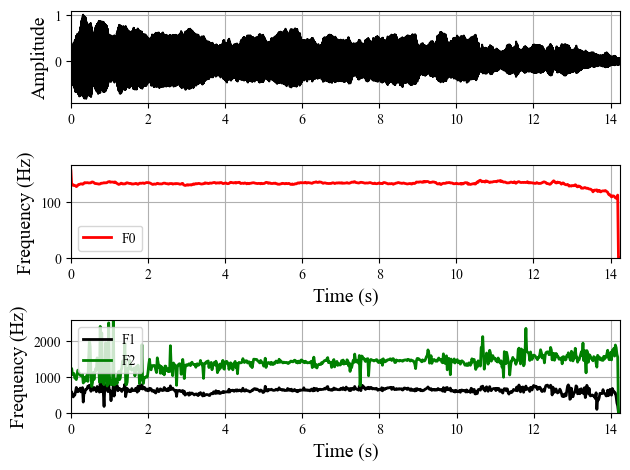

Processing AVPEPUDEA0057_a2.wav:  95%|█████████▍| 142/150 [00:52<00:03,  2.56it/s]

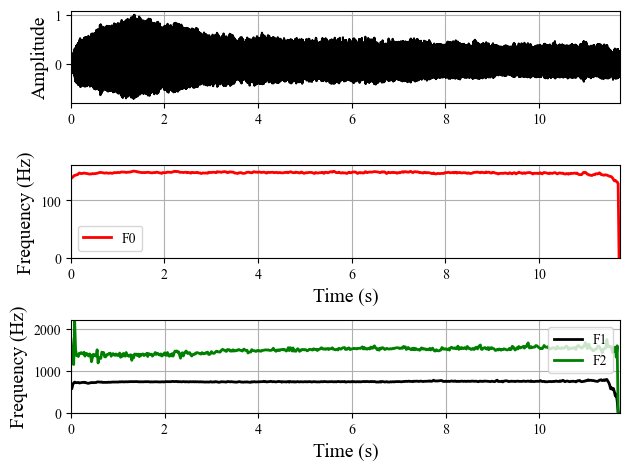

Processing AVPEPUDEA0057_a3.wav:  95%|█████████▌| 143/150 [00:52<00:02,  2.45it/s]

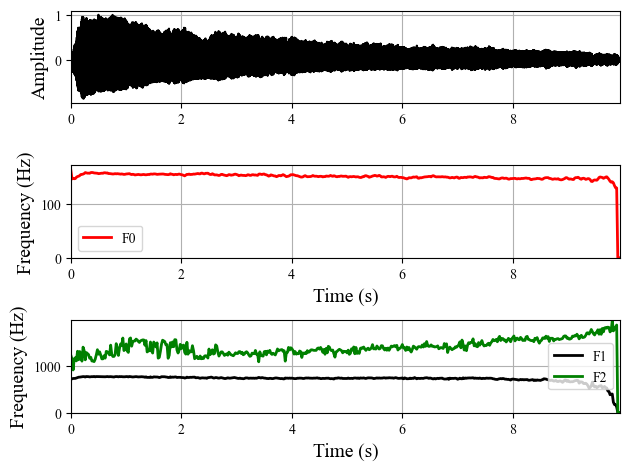

Processing AVPEPUDEA0058_a1.wav:  96%|█████████▌| 144/150 [00:53<00:02,  2.46it/s]

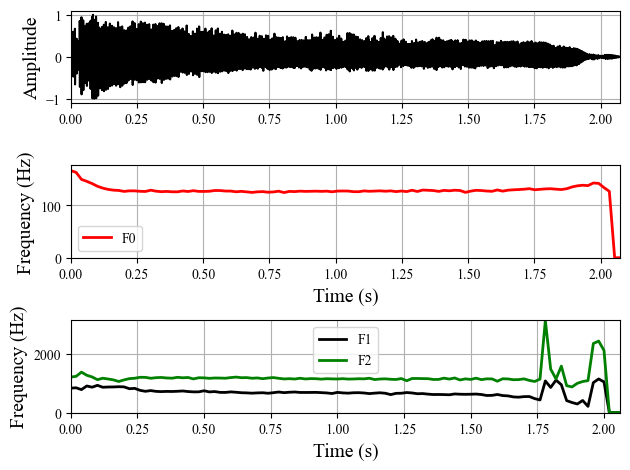

Processing AVPEPUDEA0058_a2.wav:  97%|█████████▋| 145/150 [00:53<00:01,  2.60it/s]

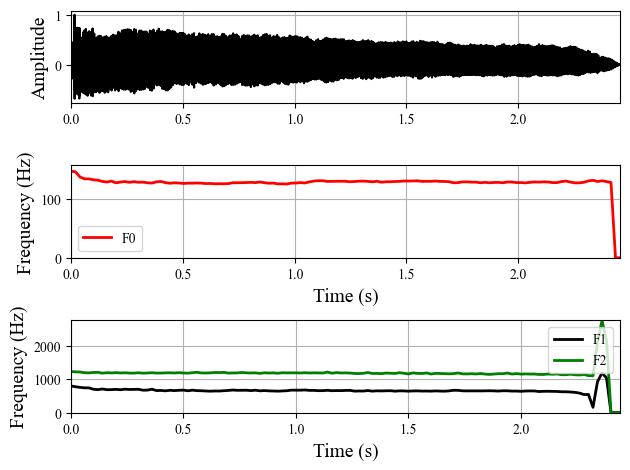

Processing AVPEPUDEA0058_a3.wav:  97%|█████████▋| 146/150 [00:53<00:01,  2.63it/s]

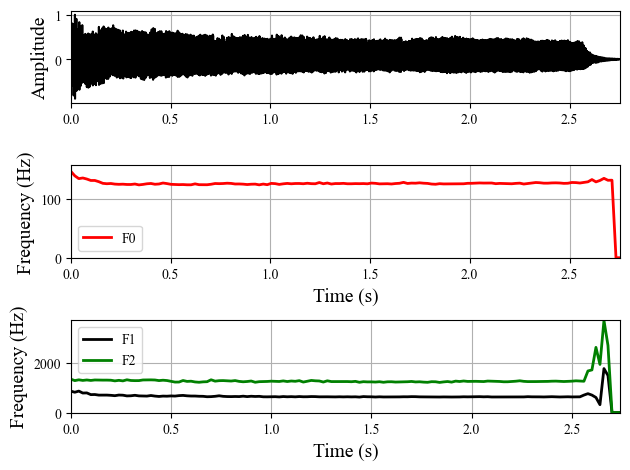

Processing AVPEPUDEA0059_a1.wav:  98%|█████████▊| 147/150 [00:54<00:01,  2.78it/s]

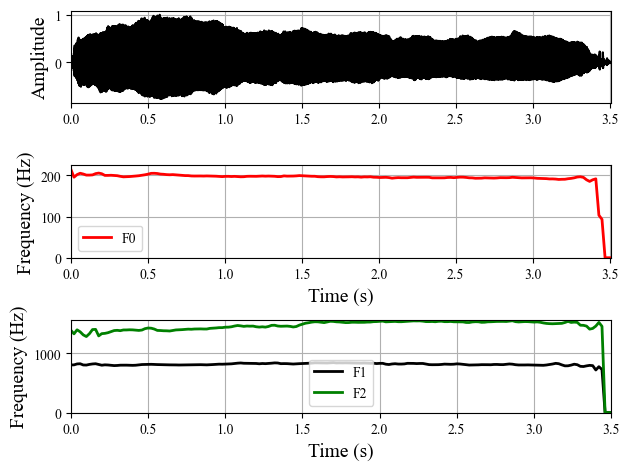

Processing AVPEPUDEA0059_a2.wav:  99%|█████████▊| 148/150 [00:54<00:00,  2.70it/s]

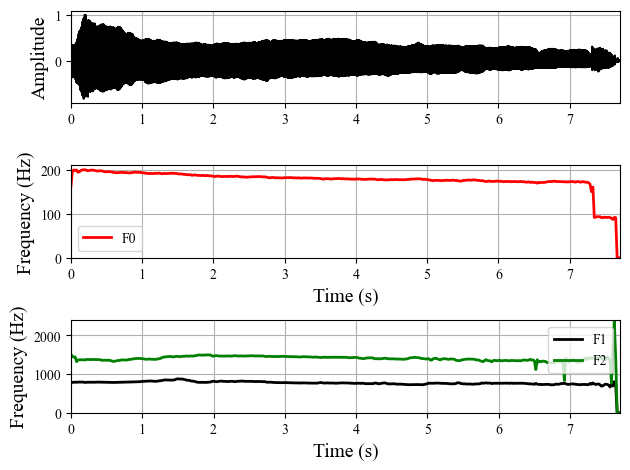

Processing AVPEPUDEA0059_a3.wav:  99%|█████████▉| 149/150 [00:54<00:00,  2.66it/s]

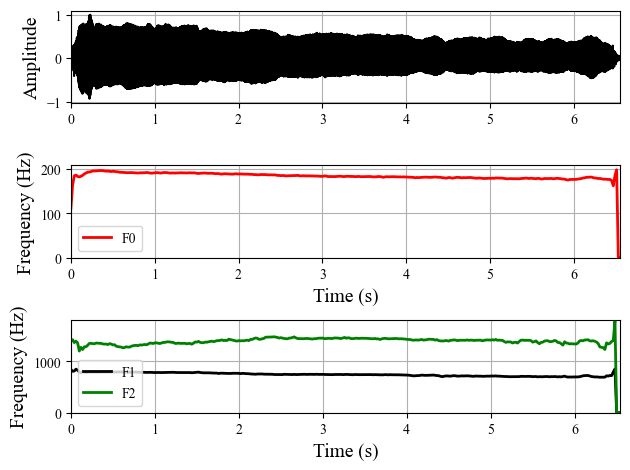

Processing AVPEPUDEA0059_a3.wav: 100%|██████████| 150/150 [00:55<00:00,  2.71it/s]

     avg BBEon_1  avg BBEon_2  avg BBEon_3  avg BBEon_4  avg BBEon_5  \
0            0.0          0.0          0.0          0.0          0.0   
1            0.0          0.0          0.0          0.0          0.0   
2            0.0          0.0          0.0          0.0          0.0   
3            0.0          0.0          0.0          0.0          0.0   
4            0.0          0.0          0.0          0.0          0.0   
..           ...          ...          ...          ...          ...   
145          0.0          0.0          0.0          0.0          0.0   
146          0.0          0.0          0.0          0.0          0.0   
147          0.0          0.0          0.0          0.0          0.0   
148          0.0          0.0          0.0          0.0          0.0   
149          0.0          0.0          0.0          0.0          0.0   

     avg BBEon_6  avg BBEon_7  avg BBEon_8  avg BBEon_9  avg BBEon_10  ...  \
0            0.0          0.0          0.0          0.0  

In [10]:
## Extract static features from a path return them as a numpy array
features1=articulationf.extract_features_path(path_audio, static=True, plots=True, fmt="csv")
print(features1)

## Phonation 
- Speech sounds related to the glottal source and resonant structures of the vocal folds. 
    - Vocal folds either holding open for air to pass or vibrating to make sound. 
- Material to use: vowels. 

##### Information about the features: 
- Compute phonation features from sustained vowels and continuous speech.
- For continuous speech, the features are computed over voiced segments

- Seven descriptors are computed:
    1. First derivative of the fundamental Frequency
    2. Second derivative of the fundamental Frequency
    3. Jitter
    4. Shimmer
    5. Amplitude perturbation quotient
    6. Pitch perturbation quotient
    7. Logaritmic Energy

- Static or dynamic matrices can be computed:
    - Static matrix is formed with 29 features formed with (seven descriptors) x (4 functionals: mean, std, skewness, kurtosis) + degree of Unvoiced
    - Dynamic matrix is formed with the seven descriptors computed for frames of 40 ms.

In [ ]:
phonationf=Phonation()

In [ ]:
## Extract features and return them as a numpy array
features1=phonationf.extract_features_file(file_audio, static=False, plots=True, fmt="npy")
print(features1.shape)

In [ ]:
## Extract static features and return them as a dataframe 
features1=phonationf.extract_features_file(file_audio, static=True, plots=True, fmt="csv")
print(features1)

In [ ]:
## Extract dynamic features and return them as a dataframe
features1=phonationf.extract_features_file(file_audio, static=False, plots=False, fmt="csv")
print(features1.head())

In [ ]:
## Extract dynamic features and return them as a torch tensor
features1=phonationf.extract_features_file(file_audio, static=False, plots=False, fmt="torch")
print(features1.dtype)
print(features1.size())

In [ ]:
## Extract static features from a path return them as a numpy array
features1=phonationf.extract_features_path(path_audio, static=True, plots=False, fmt="csv")
print(features1)

## Prosody 
- Paralinguistic features such as 
    - Pitch 
    - Loudness 
    - Duration (and rhythm and pausing)

- Material to use: speech that is not individual phonetic segments but properties of syllables and larger units of speech --> words, sentences, monologue and DKK. 

##### Information about the features: 
# Extraction of prosody features from audio files
- Compute prosody features from continuous speech.

- 103 features are computed:

Num     Feature                                                          Description

--------------------------------------------------------------------------------------------------------------------------
                                Features based on F0
                                
---------------------------------------------------------------------------------------------------------------------------
1-6     F0-contour                                                       Avg., Std., Max., Min., Skewness, Kurtosis

7-12    Tilt of a linear estimation of F0 for each voiced segment        Avg., Std., Max., Min., Skewness, Kurtosis

13-18   MSE of a linear estimation of F0 for each voiced segment         Avg., Std., Max., Min., Skewness, Kurtosis

19-24   F0 on the first voiced segment                                   Avg., Std., Max., Min., Skewness, Kurtosis

25-30   F0 on the last voiced segment                                    Avg., Std., Max., Min., Skewness, Kurtosis

--------------------------------------------------------------------------------------------------------------------------
                                Features based on energy
                                
---------------------------------------------------------------------------------------------------------------------------
31-34   energy-contour for voiced segments                               Avg., Std., Skewness, Kurtosis

35-38   Tilt of a linear estimation of energy contour for V segments     Avg., Std., Skewness, Kurtosis

39-42   MSE of a linear estimation of energy contour for V segment       Avg., Std., Skewness, Kurtosis

43-48   energy on the first voiced segment                               Avg., Std., Max., Min., Skewness, Kurtosis

49-54   energy on the last voiced segment                                Avg., Std., Max., Min., Skewness, Kurtosis

55-58   energy-contour for unvoiced segments                             Avg., Std., Skewness, Kurtosis

59-62   Tilt of a linear estimation of energy contour for U segments     Avg., Std., Skewness, Kurtosis

63-66   MSE of a linear estimation of energy contour for U segments      Avg., Std., Skewness, Kurtosis

67-72   energy on the first unvoiced segment                             Avg., Std., Max., Min., Skewness, Kurtosis

73-78   energy on the last unvoiced segment                              Avg., Std., Max., Min., Skewness, Kurtosis

--------------------------------------------------------------------------------------------------------------------------
                                Features based on duration
                                
---------------------------------------------------------------------------------------------------------------------------
79      Voiced rate                                                      Number of voiced segments per second

80-85   Duration of Voiced                                               Avg., Std., Max., Min., Skewness, Kurtosis

86-91   Duration of Unvoiced                                             Avg., Std., Max., Min., Skewness, Kurtosis

92-97   Duration of Pauses                                               Avg., Std., Max., Min., Skewness, Kurtosis

98-103  Duration ratios                                                  Pause/(Voiced+Unvoiced), Pause/Unvoiced, Unvoiced/(Voiced+Unvoiced),
                                                                         Voiced/(Voiced+Unvoiced), Voiced/Puase, Unvoiced/Pause

---------------------------------------------------------------------------------------------------------------------------



In [ ]:
prosodyf=Prosody()

In [ ]:
## Extract features and return them as a numpy array
features1=prosodyf.extract_features_file(file_audio, static=True, plots=True, fmt="npy")
print(features1.shape)

In [ ]:
## Extract static features and return them as a dataframe 
features1=prosodyf.extract_features_file(file_audio, static=True, plots=False, fmt="csv")
print(features1)

In [ ]:
## Extract dynamic features and return them as a dataframe
features1=prosodyf.extract_features_file(file_audio, static=False, plots=False, fmt="csv")
print(features1)
print(features1.head())

In [ ]:
## Extract dynamic features and return them as a torch tensor
features1=prosodyf.extract_features_file(file_audio, static=False, plots=False, fmt="torch")
print(features1.dtype)
print(features1.size())

In [ ]:
## Extract static features from a path return them as a pandas df. 
features1=prosodyf.extract_features_path(path_audio, static=True, plots=False, fmt="csv")
display(features1)